In [1]:
from dask.distributed import Client
import multiprocessing

ncpu = multiprocessing.cpu_count()
nworker = 8
threads = ncpu // nworker
print(ncpu, threads, nworker)

client = Client(
    processes=False, threads_per_worker=threads, n_workers=nworker, memory_limit="64GB"
)
client

72 9 8


/work/mh0727/m300524/miniconda3/envs/pymistral/lib/python3.7/site-packages/distributed/node.py:155: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 36447 instead
  http_address["port"], self.http_server.port


Client Scheduler: inproc://10.50.47.45/57796/1 Dashboard: http://localhost:8888/proxy/36447/status,Cluster Workers: 8 Cores: 72 Memory: 512.00 GB


In [1]:
%load_ext lab_black

In [2]:
import xarray as xr

xr.set_options(keep_attrs=True)
import os
import dask
import numpy as np
import pandas as pd
import warnings

warnings.simplefilter("ignore")

from tqdm.notebook import tqdm
import xskillscore as xs
import regionmask
import geopandas
import esmtools as et
from esmtools.stats import rm_trend
import pymistral

In [3]:
# plotting options
import matplotlib.pyplot as plt
import matplotlib as mpl
import cmocean
import seaborn as sns

%matplotlib inline
mpl.rcParams["savefig.dpi"] = 300
mpl.rcParams["savefig.pad_inches"] = 0
mpl.rcParams["savefig.format"] = "eps"
savefig = False
sns.set_context("notebook")
# mpl.rcParams

# PMassim ATM setup

In [4]:
# post
from basics import to_zarr, load_var_cdo, output_df2, output_df, _maybe_auto_chunk

# paths
from basics import (
    c,
    outpath,
    exppath,
    postpath,
    atmvarlist,
    oceanvarlist,
    ocean_zarr,
    atm_zarr,
)

# runs
from basics import direct_run, indirect_run, run_dict

# area
from basics import ocean_area, land_area, global_agg, yearmean, var_area

# metadata
from basics import (
    latexify_units,
    add_showname,
    convert_C,
    kgC_s_to_PgC_month,
    showname_dict,
)

long_name_rename_dict = showname_dict

# plot
from basics import add_figurelabels, c_dict

# misc
from basics import clean

In [5]:
targetyear = 1850  # nudge years starting from this over baseyear restart file
baseyear = 2006  # restart file from vga0220a

In [6]:
from basics import metrics, metric_shortname, metric_longname

In [7]:
# first row in log table
runs_raw = [
    "SSTSSS",
    "SSTSSSISDICSALK",
    "ATMSSTSSSISDICSALK",
    "ATM",
    "ATMsfn",
    "TS",
    "TSI",
    "TSIDICALK",
    "TSIDICALK2",
    "ATMsfnTS",
    "ATMsfnTSI",
    "ATMsfnTSI2",
    "ATMTS",
    "ATMTSI",
    "ATMTSI2",
    "ATMTSI3" "ATMsfnTSIDICALK",
    "ATMTSINUT",
    "ATMTSIDICALK",
    "ATMTSIDICALK2",
    "ATMTSIDICALKNUT",
    "ATMTSIrhamocc",
    "ATMTSIlandrveg",
    "ATMTSIlandrnosurf",
    "ATMTSIDICALKlandrall",
    "ATMTSIDICALKlandrall5",
    "ATMTSIDICALKlandralls",
    c,
]
len(runs_raw)

# how to rename ATMTSI3

27

In [8]:
sns.set_palette("cmo.haline_r", len(runs_raw))

In [9]:
run_rename_dict = dict()
run_rename_dict["ATMsfnTSI"] = "ATMsfnTS2"  # forgot ice nudging
run_rename_dict["ATMsfnTSIDICALK"] = "ATMsfnTSDICALK"  # forgot ice nudging
run_rename_dict["ATMTSI"] = "ATMTS2"  # forgot ice nudging
run_rename_dict["ATMTSIDICALK"] = "ATMTSDICALK"  # forgot ice nudging
run_rename_dict["TSI"] = "TS2"  # forgot ice nudging
run_rename_dict["TSIDICALK"] = "TSDICALK"  # forgot ice nudging
run_rename_dict["SSTSSSISDICSALK"] = "SSTSSSSDICSALK"  # forgot ice nudging
run_rename_dict["ATMSSTSSSISDICSALK"] = "ATMSSTSSSSDICSALK"  # forgot ice nudging
run_rename_dict["ATMTSIDICALK2"] = "ATMTSIDICALK"  # rerun with ice
run_rename_dict["TSIDICALK2"] = "TSIDICALK"  # rerun with ice
run_rename_dict["ATMTSI2"] = "ATMTSI2"  # rerun with ice
run_rename_dict["ATMsfnTSI2"] = "ATMsfnTSI"  # rerun with ice
run_rename_dict["ATMsfnTSIDICALK2"] = "ATMsfnTSIDICALK"  # rerun with ice
run_rename_dict[
    "ATMTSIlandrveg"
] = "ATMTSIlandrall"  # restart files annualy on all streams
run_rename_dict[
    "ATMTSIDICALKlandrall"
] = "ATMTSIDICALKlandr1"  # unsure whether this is correct
run_rename_dict[
    "ATMTSIDICALKlandrall5"
] = "ATMTSIDICALKlandR"  # unsure whether this is correct
run_rename_dict[
    "ATMTSIDICALKlandrall2"
] = "ATMTSIDICALKland2"  # unsure whether this is correct
run_rename_dict["ATMTSI3"] = "ATMTSI"
run_rename_dict["ATMTSIDICALKlandralls"] = "ATMTSIDICALKlandr"

In [10]:
runs_renamed = [run_rename_dict.get(i, i) for i in runs_raw]
# runs_renamed

# Load output

In [11]:
v = "co2_flx_land"  # "co2_flux"
timestr = ""
nyears = 48
start = 1850
end = start + nyears
timestr = str(start)[: -len(str(nyears))]
timestr

pa = {"robust": True, "yincrease": output_df2.loc[v]["model"] in ["echam6", "jsbach"]}
pa

{'robust': True, 'yincrease': True}

In [12]:
runs_raw_minimum = [c, "ATM", "TS", "ATMTSI3", "ATMTSIDICALKlandralls"]
# runs_raw_minimum_label = ['perfect']

## to netcdf

In [13]:
def process_var(v=v, runs_raw=runs_raw_minimum):
    # print(f'find {runs_raw}')
    sel = "" if v != "CO2" else ",levidx=47"

    ds_list = []
    sel += f",year={start}/{end}"

    for run in tqdm(runs_raw):
        expid = (
            f"asp_esmControl_PMassim_1850_{run}_over_2006" if "Rerun" not in run else c
        )
        try:
            ds = load_var_cdo(
                exppath=exppath,
                var=v,
                expid=expid,
                timestr=timestr,
                sel=sel,
                output_df=output_df2,
            )[v].squeeze()
        except Exception as e:
            print(f"run {run} not found because {e}\n")
            runs_raw = runs_raw.copy()
            runs_raw.remove(run)
        ds["time"] = xr.cftime_range(start=str(start), freq="MS", periods=ds.time.size)
        ds = ds.sel(time=slice(str(start), str(end)))
        ds_list.append(ds)
    ds = xr.concat(ds_list, "run")
    ds["run"] = [run_rename_dict.get(i, i) for i in runs_raw]
    return ds

In [14]:
# v='spco2'
# ds = process_var(v=v, runs_raw=runs_raw_minimum)
# sns.set_palette('Set2',3)
# yearmean(convert_C(ds.mean(['x','y']))).plot(hue='run')

## to zarr

### many variables from all runs

In [15]:
#!ls -all /work/mh0727/m300524/191008_PM_assim/post

In [16]:
import shutil

# shutil.rmtree(atm_zarr)
# shutil.rmtree(ocean_zarr)

In [17]:
#%time to_zarr(atmvarlist, name="atm", process_var=process_var)

In [18]:
#%time to_zarr(oceanvarlist, name="ocean",process_var=process_var)

### add new run to existing zarr

In [19]:
new_runs = (
    []
)  # ['ATMTSIDICALKlandrall2']#['ATMTSIDICALKlandrall',"ATMTSIDICALKlandrall5"]

from basics import add_varlist_of_runs_to_zarr

for new_run in new_runs:
    for i, (z, varlist) in enumerate(
        zip([atm_zarr, ocean_zarr], [atmvarlist, oceanvarlist])
    ):
        add_varlist_of_runs_to_zarr(z, varlist, [new_run])

## Misc

In [20]:
def diff_c(ds):
    return ds.drop_sel(run=c) - ds.sel(run=c)

In [21]:
months = [
    "Jan",
    "Feb",
    "Mar",
    "Apr",
    "May",
    "Jun",
    "Jul",
    "Aug",
    "Sep",
    "Oct",
    "Nov",
    "Dec",
]


def split_into_months(dss):
    dss2 = []
    time = dss.sel(time=dss.time.dt.month == 1).time.dt.year.values
    for m in np.arange(1, 13):
        dss22 = dss.sel(time=dss.time.dt.month == m)
        dss22["time"] = time
        dss2.append(dss22)
    dss2 = xr.concat(dss2, dim="month")
    dss2["month"] = np.arange(1, 13)
    return dss2

## metrics

In [22]:
def bias(rec, target, dim):
    return (rec - target).mean(dim)


def metric_over_time(ds, control=None, metric="pearson_r", window=10, dim="time"):
    if c in ds.run:
        if control is None:
            control = ds.sel(run=c)
        ds = ds.drop_sel(run=c)
    i = 0
    res = []
    time_label = []
    while i < ds[dim].size - window:
        time_label.append(f"{i}-{i+window}")
        ds_part = ds.isel({dim: slice(i, i + window)})
        control_part = control.isel({dim: slice(i, i + window)})
        if metric in ["pearson_r", "rmse", "mae", "mse"]:
            res.append(
                getattr(xs, metric)(
                    *xr.broadcast(control_part, ds_part), dim=dim, skipna=False
                )
            )
        elif metric == "bias":
            res.append(bias(ds_part, control_part, dim))
        i += 1
    res = xr.concat(res, "time")
    # res['time']=time_label
    return res

In [23]:
def metrics_over_time(dszsm, metrics=["pearson_r", "rmse"], window=10):
    R = xr.concat(
        [
            metric_over_time(dszsm, dszsm.sel(run=c), metric=m, window=window)
            for m in metrics
        ],
        "metric",
    )
    R["metric"] = metrics
    # R['month']=months
    return R

In [24]:
def resample_target_metrics(
    dszsm, metrics=["pearson_r", "rmse"], iterations=50, dim="time", periods=10
):
    metrics = [metric for metric in metrics if hasattr(xs, metric)]
    t1 = []
    t2 = []
    init = dszsm
    time = xr.cftime_range(start="2000", periods=periods)
    idx = np.linspace(
        (np.arange(init[dim].size - time.size)),
        (np.arange(init[dim].size - time.size)),
        iterations,
        dtype="int",
    )
    # shuffle each line
    for ndx in np.arange(iterations):
        np.random.shuffle(idx[ndx])
    idx_da = xr.DataArray(
        idx,
        dims=("iteration", dim),
        coords=(
            {
                "iteration": range(iterations),
                dim: init[dim].isel({dim: slice(None, -time.size)}),
            }
        ),
    )
    for i in range(iterations):
        tt1 = idx_da.isel(iteration=i, time=0).values
        tt2 = idx_da.isel(iteration=i, time=1).values
        # print(tt2, tt1)

        t1.append(
            dszsm.sel(run=c)
            .isel(time=slice(tt1, tt1 + time.size))
            .assign_coords(time=time)
        )
        t2.append(
            dszsm.sel(run=c)
            .isel(time=slice(tt2, tt2 + time.size))
            .assign_coords(time=time)
        )
    t1 = xr.concat(t1, "iteration")
    t2 = xr.concat(t2, "iteration")
    r = xr.concat([getattr(xs, metric)(t1, t2, "time") for metric in metrics], "metric")
    r["metric"] = metrics
    return r

In [25]:
#%time rtm = resample_target_metrics(dszsm,iterations=500)

# tracking performance

In [26]:
CUT = 10

In [27]:
iterations = 500

In [28]:
run_metrics = ["bias", "mae", "pearson_r", "rmse"]

In [29]:
indirect_runs = ["TS", "ATM", "ATMTSI", c]

In [30]:
mpl.rcParams["savefig.dpi"] = 150

## functions spatial maps

In [ ]:
v = "u10"
tp[v]

In [66]:
l = list(tp.data_vars)
l

['temp2', 'precip', 'u10', 'v10']

In [67]:
l.index(v)

2

In [123]:
import textwrap

mpl.rcParams["savefig.dpi"] = 300


def label_from_attrs(da, extra="", width=30):
    """ Makes informative labels if variable metadata (attrs) follows
        CF conventions. """

    if da.attrs.get("long_name"):
        name = da.attrs["long_name"]
    elif da.attrs.get("standard_name"):
        name = da.attrs["standard_name"]
    elif da.name is not None:
        name = da.name
    else:
        name = ""

    if da.attrs.get("units"):
        units = " [{}]".format(da.attrs["units"])
    else:
        units = ""

    return "\n".join(textwrap.wrap(name + extra + units, width=width))


plt.rcParams.update({"hatch.color": "gray"})


def plot_map_contour(tp, savefig=True, map_contour=True, **kwargs):

    # todo:
    # -rm boundary stippling

    def f(
        tp, linewidth=0.5, lev=[-1, 1], hatching_style="....", **kwargs,
    ):
        kwargs["levels"] = lev
        kwargs["colors"] = "white"
        del kwargs["cmap"]
        v = tp.name
        metric = str(tp.metric.values)
        plot = "contour"
        if metric == "bias":
            # tp_map = tp/std[v]
            tp_map = tp / rt_mae[v]
            fmt = "%i std"
            plot = "shading"
        elif metric == "pearson_r":
            tp_map = tp / rt_pearson_r[v]  # greater one: tp better rt
            fmt = "95$^{th}$"
            plot = "shading"
        elif metric == "rmse":
            tp_map = tp / rt_rmse[v]  # lower one: tp better rt
            fmt = "5$^{th}$"
            plot = "shading"
        elif metric == "mae":  # lower one: tp better rt
            tp_map = tp / rt_mae[v]
            fmt = "5$^{th}$"
            plot = "shading"
        # fix lon # apperently not needed
        # if "lon" in tp_map.coords:
        #    tp_map["lon"] = tp["lon"]
        # if "longitude" in tp_map.coords:
        #    tp_map["longitude"] = tp["longitude"]

        # contour
        if plot == "contour":
            kwargs["levels"] = [1]
            CS = tp_map.plot.contour(
                alpha=1, linewidths=[linewidth] * len(kwargs["levels"]), **kwargs
            )
            kwargs["ax"].clabel(CS, inline=True, fontsize=8, fmt=fmt)
        # stippling
        elif plot == "shading":
            kwargs["colors"] = "none"
            if metric == "bias":  # larger hatched
                kwargs["levels"] = [-np.inf, -1, 1, np.inf]
                kwargs["hatches"] = [hatching_style, "", hatching_style]
            elif metric == "pearson_r":  # smaller one hatched
                kwargs["levels"] = [0, 1, np.inf]
                kwargs["hatches"] = [hatching_style, ""]
                # kwargs["levels"] = [-np.inf, 1, np.inf]
                # kwargs["hatches"] = ["", hatching_style]
            elif metric in ["rmse", "mae"]:
                kwargs["levels"] = [0, 1, np.inf]  # larger hatched
                kwargs["hatches"] = ["", hatching_style]
            # print(metric, v, kwargs["levels"], kwargs["hatches"])
            CS = tp_map.plot.contourf(**kwargs)
            kwargs["ax"].set_global()
        return CS

    metric_str = str(tp.metric.values)
    if "cmap" not in kwargs:
        if metric_str == "pearson_r":
            kwargs["cmap"] = "viridis"
        elif metric_str in ["rmse", "mae"]:
            kwargs["cmap"] = "viridis_r"
        elif metric_str in ["bias"]:
            kwargs["cmap"] = "RdBu_r"

    if "aspect" in kwargs:
        aspect = kwargs.pop("aspect")
    else:
        aspect = 1.7

    v = tp.name
    if v in ["co2_flx_land", "box_Cpools_total"]:
        kwargs["feature"] = "ocean"
    elif v in ["co2_flx_ocean", "spco2", "fgco2"]:
        kwargs["feature"] = "land"
    elif v in ["CO2", "slp", "wind10", "u10", "v10", "temp2"]:
        kwargs["feature"] = None

    if map_contour:
        long_name = tp.attrs["long_name"]
        units = "" if metric_str == "pearson_r" else tp.attrs["units"]
        if long_name.startswith("Ocean mixed layer"):
            long_name = "Mixed layer depth"
        for s in ["mean", "total"]:
            if s in long_name:
                long_name = long_name.strip(s)
        # label = f"{long_name} {metric_shortname[metric_str]} [{units}]"
        label = f"{long_name} {metric_shortname[metric_str]} [{units}]"
        if len(label) > 25:
            label = (
                "\n".join(
                    textwrap.wrap(
                        f"{long_name} {metric_shortname[metric_str]}", width=25
                    )
                )
                + f"\n [{units}]"
            )
        else:
            label = "\n".join(
                textwrap.wrap(
                    f"{long_name} {metric_shortname[metric_str]} [{units}]", width=25
                )
            )
        cbar_kwargs_fg = {"pad": 0.02, "shrink": 0.5, "label": label}
        fg = tp.plot_map(col="run", cbar_kwargs=cbar_kwargs_fg, aspect=aspect, **kwargs)
    else:
        fg = tp.plot_map(col="run", aspect=aspect, **kwargs)

    for ax in fg.axes:
        v = fg.data.name
        label_counter = list(rt_mae.data_vars).index(v)
        add_figurelabels(ax, shift=label_counter * 3)

    if map_contour:
        if "x" in tp.dims:
            x = "longitude"
            y = "latitude"
        elif "lon" in tp.dims:
            x = "lon"
            y = "lat"
        fg.map_dataarray(f, x=x, y=y, add_colorbar=False)
    if savefig:
        filename = f"map_{str(tp.metric.values)}_{str(tp.name)}_contour.png"
        plt.savefig(filename, bbox_inches="tight", pad_inches=0)
    label_counter = 0
    return fg

In [83]:
# plot_map_contour(tp.sel(metric="bias")[v])

In [84]:
# plot_map_contour(tp.sel(metric="rmse")[v])

In [85]:
# plot_map_contour(tp.sel(metric="pearson_r")[v])

In [86]:
def merge(metric="ACC", new_name="physics", contour="95th", rm=True, sort=True):
    import os
    from subprocess import call

    if "debiased" in metric:
        metric = metric.replace("debiased", "").strip("_")
        debiased = True
    else:
        debiased = False
    f = [f for f in os.listdir(".") if f"map_{metric}" in f]
    f = [i for i in f if "contour.png" in i]
    if sort:
        f.sort(key=os.path.getctime)
    # print('find:',f)
    new_metric_str = metric if not debiased else f"debiased_{metric}"
    new_file = f"map_{new_metric_str}_{new_name}_contour_{contour}.png"

    to_call = ["convert"] + f + ["-append", new_file]
    # print('call',to_call)
    call(to_call)
    if rm:
        # print('remove', f)
        for i in f:
            os.remove(i)
    return new_file

In [87]:
from basics import reset_attrs


def debias(dsz, how="mean", ta="guess", cut=CUT):
    """Remove first cut years and rm mean or detrend."""
    dsz = dsz.isel(time=slice(cut, None))
    if ta == "guess":
        if "month" in dsz.coords:
            ta = "month"
        else:
            ta = "annual"
    if how == "mean":
        if ta == "annual":
            dsz = dsz - dsz.mean("time")
        elif ta == "month":
            dsz = dsz - dsz.mean("time")
            del dsz["month"]
    elif how == "detrend":
        dsz = reset_attrs(rm_trend(dsz), dsz)
    else:
        raise ValueError("fix how")
    return dsz


how_debias = "detrend"

## physics

### atmosphere (Spring 2021 Figs. 1 & 2)

In [37]:
new_name = "atm_physics"

In [38]:
atmvarlist_physics = ["temp2", "precip", "u10", "v10"]
# atmvarlist_physics = ['temp2','precip','co2_flx_land','co2_flx_ocean'] # for SAB poster

In [39]:
dsz = xr.open_zarr(atm_zarr)[atmvarlist_physics]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs)
dszym = yearmean(dsz).chunk({"time": -1}).persist()

#### ym tracking performance maps

In [40]:
mean = dszym.sel(run=c).mean("time").compute()
std = dszym.sel(run=c).std("time").compute()

tp = metrics_over_time(dszym, metrics=run_metrics).mean("time").compute()

In [125]:
rt_pearson_r = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="pearson_r")
    .chunk({"iteration": -1})
    .quantile(0.95, "iteration", skipna=True)
    .compute()
)
rt_rmse = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="rmse")
    .chunk({"iteration": -1})
    .quantile(0.05, "iteration", skipna=True)
    .compute()
)

In [76]:
rt_mae = (
    resample_target_metrics(dszym, metrics=run_metrics, iterations=iterations)
    .sel(metric="mae")
    .chunk({"iteration": -1})
    .quantile(0.05, "iteration", skipna=True)
    .compute()
)

In [47]:
# mean.u10.plot_map()

# mean.v10.plot_map()

In [48]:
# MAYBE REUSE?!
# for var in ['co2_flx_land','co2_flx_ocean']:
#    tp[var].attrs['long_name']=tp[var].attrs['long_name'].replace(' (acc.)','')

##### bias
ATM nuding brings regional mean bias

'map_bias_atm_physics_contour_std.png'

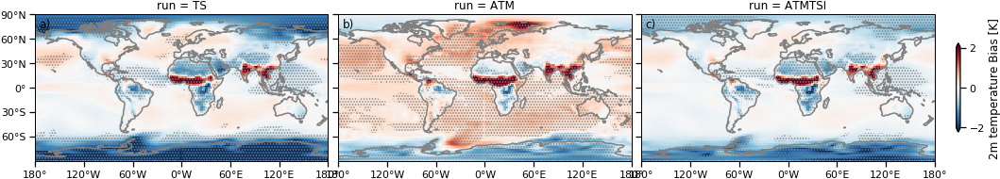

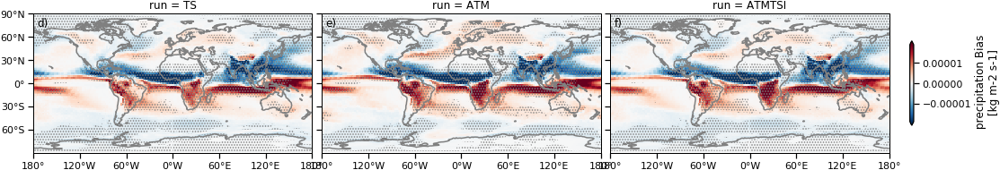

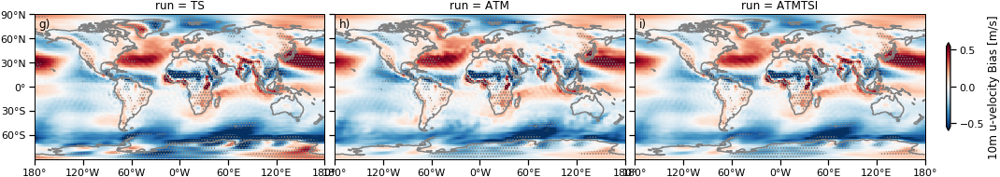

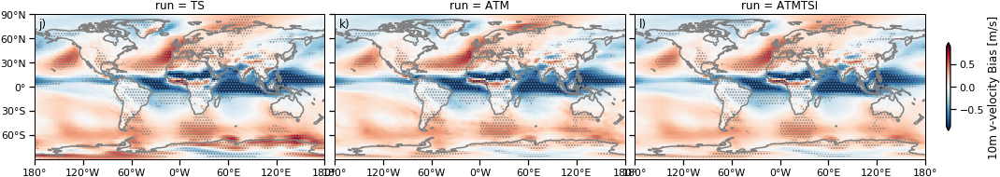

In [126]:
fg = tp.sel(metric="bias").map(plot_map_contour)
merge(metric="bias", new_name=new_name, contour="std")

##### ACC

'map_pearson_r_atm_physics_contour_95th.png'

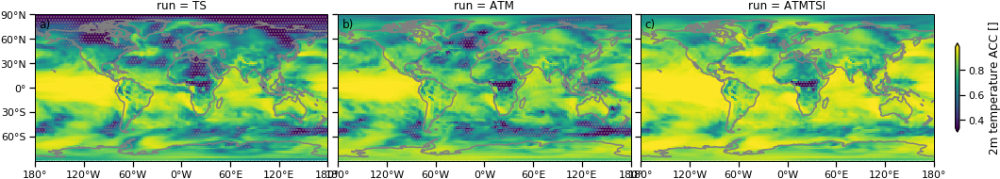

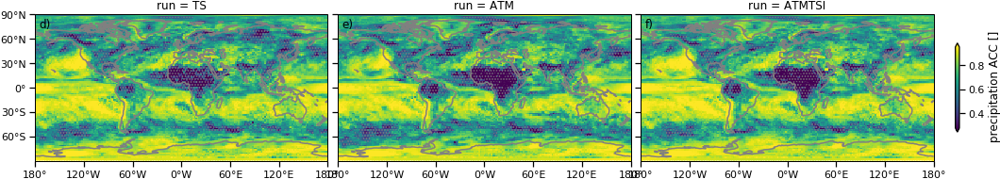

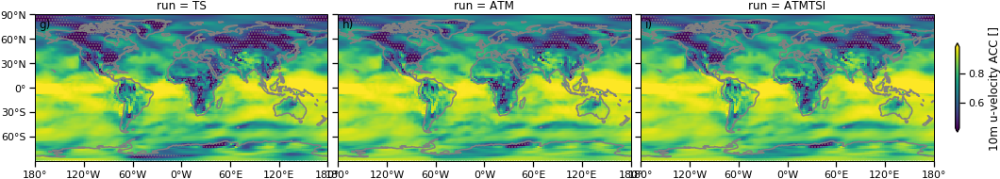

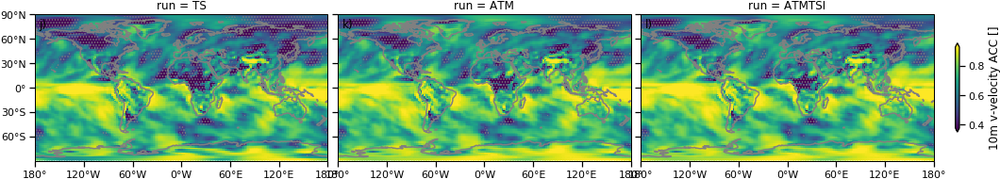

In [127]:
metric = "pearson_r"
_ = tp.sel(metric=metric).map(plot_map_contour)
merge(metric=metric, new_name=new_name, contour="95th")

##### rmse

'map_rmse_atm_physics_contour_5th.png'

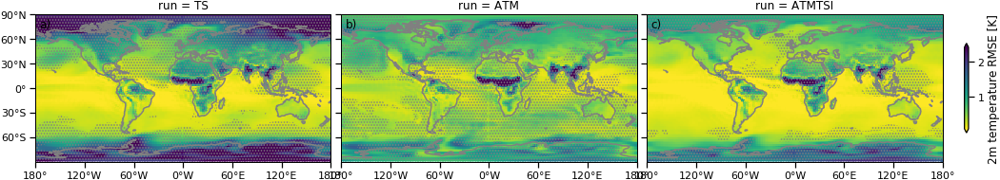

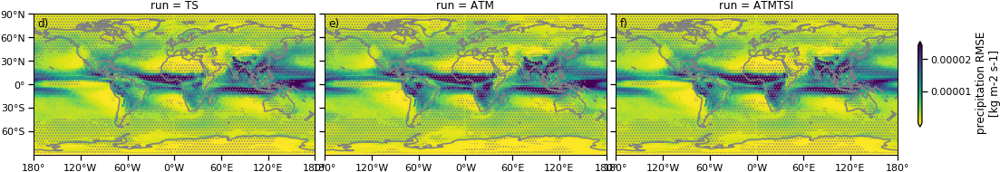

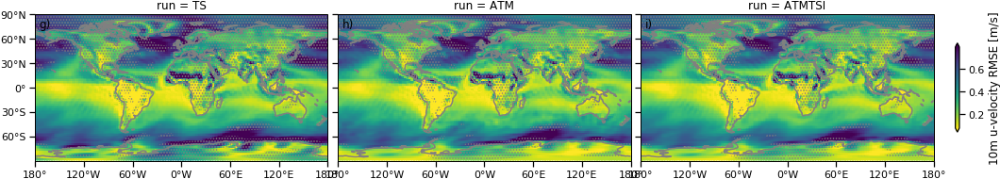

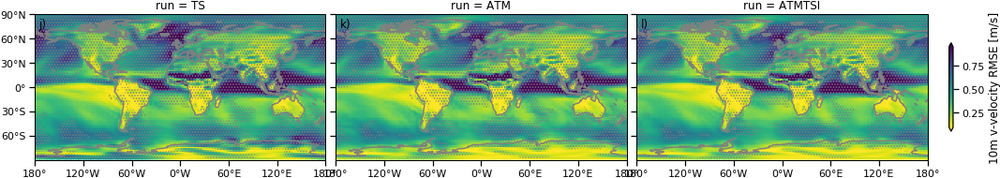

In [128]:
metric = "rmse"
_ = tp.sel(metric=metric).map(plot_map_contour)
merge(metric=metric, new_name=new_name, contour="5th")

- without mean bias reduction:
    - `ATM` nudging leads to local biases
- with mean bias reduction:
    - `ATM` nudging tracks variations well

##### debiased rmse

In [129]:
dszym_debiased = debias(dszym, cut=CUT, how=how_debias)
%time tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

CPU times: user 1min 32s, sys: 6.81 s, total: 1min 39s
Wall time: 1min 29s


'map_debiased_rmse_atm_physics_contour_5th.png'

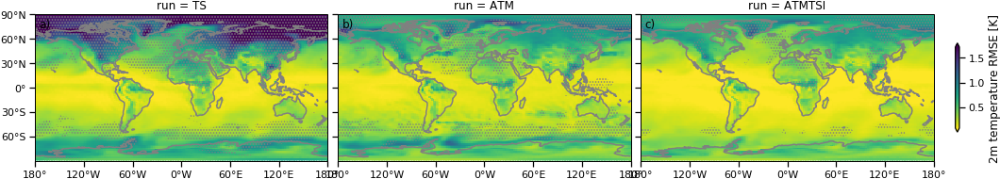

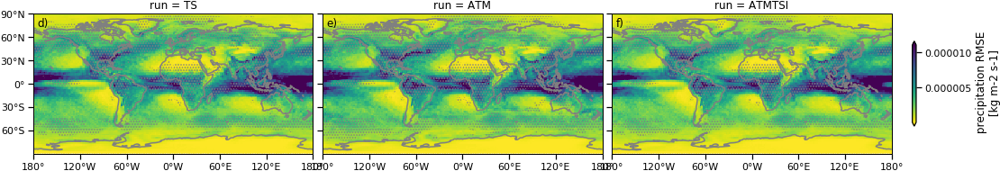

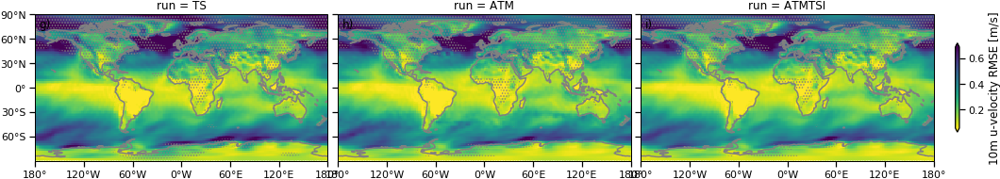

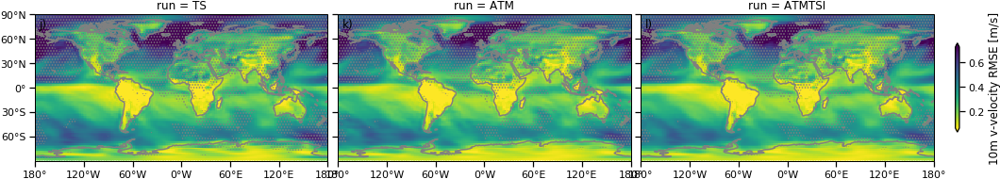

In [130]:
_ = tp_debiased.sel(metric="rmse").map(plot_map_contour, feature=None)
merge(metric="debiased_rmse", new_name=new_name, contour="5th")

## carbon (Spring 2021 Fig. 4 & 5)

In [131]:
new_name = "carbon"
feature = None

In [132]:
varlist_carbon = ["spco2", "fgco2", "box_Cpools_total", "co2_flx_land", "CO2"]
no_ocean_carbon_vars = 2

In [133]:
dsz = xr.open_zarr(ocean_zarr)[varlist_carbon[:no_ocean_carbon_vars]]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs)
dszymo = yearmean(dsz).chunk({"time": -1})

converted spco2 from Pa to ppm


In [134]:
dsz = xr.open_zarr(atm_zarr)[varlist_carbon[no_ocean_carbon_vars:]]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs)
dszyml = yearmean(dsz).chunk({"time": -1})

converted CO2 from kg kg-1 to ppm
converted co2_flx_land from CO2 units to C units.
converted box_Cpools_total from mol(CO2) to kgC


In [135]:
dszym = xr.merge([dszyml, dszymo]).persist()

In [136]:
for v in long_name_rename_dict.keys():
    if v in dszym.data_vars:
        dszym[v].attrs["long_name"] = long_name_rename_dict[v]

In [137]:
dszym = dszym[varlist_carbon[::-1]]

In [138]:
latitude = dszymo.rename({"lat": "latitude"}).coords["latitude"]
longitude = dszymo.rename({"lon": "longitude"}).coords["longitude"]
lat = dszyml.coords["lat"]
lon = dszyml.coords["lon"]

dszym.coords["latitude"] = latitude
dszym.coords["longitude"] = longitude
dszym.coords["lat"] = lat
dszym.coords["lon"] = lon


def set_lon_lat(dszym):
    dszym.coords["lat"] = lat
    dszym.coords["lon"] = lon
    return dszym


def set_longitude_latitude(dszym):
    dszym.coords["latitude"] = latitude
    dszym.coords["longitude"] = longitude
    return dszym

### ym tracking performance maps

In [139]:
mean = dszym.sel(run=c).mean("time").compute()
std = dszym.sel(run=c).std("time").compute()

In [140]:
tp = dszym.map(metrics_over_time, metrics=run_metrics).mean("time").compute()

In [141]:
rt_pearson_r = (
    resample_target_metrics(dszymo, metrics=["pearson_r"], iterations=iterations)
    .sel(metric="pearson_r")
    .chunk({"iteration": -1})
    .quantile(0.95, "iteration", skipna=True)
    .compute()
)
rt_pearson_r = rt_pearson_r.update(
    resample_target_metrics(dszyml, metrics=["pearson_r"], iterations=iterations)
    .sel(metric="pearson_r")
    .chunk({"iteration": -1})
    .quantile(0.95, "iteration", skipna=True)
    .compute()
)

In [142]:
rt_rmse = (
    resample_target_metrics(dszymo, metrics=["rmse"], iterations=iterations)
    .sel(metric="rmse")
    .chunk({"iteration": -1})
    .quantile(0.95, "iteration", skipna=True)
    .compute()
)
rt_rmse = rt_rmse.update(
    resample_target_metrics(dszyml, metrics=["rmse"], iterations=iterations)
    .sel(metric="rmse")
    .chunk({"iteration": -1})
    .quantile(0.95, "iteration", skipna=True)
    .compute()
)

In [143]:
%%time
rt_mae = resample_target_metrics(dszymo, metrics=['mae'],iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(.95,'iteration', skipna=True).compute()
rt_mae = rt_mae.update(resample_target_metrics(dszyml, metrics=['mae'],iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(.95,'iteration', skipna=True).compute())

CPU times: user 1min 6s, sys: 5.78 s, total: 1min 12s
Wall time: 1min 7s


#### bias
ATM nuding brings regional mean bias

'map_bias_carbon_contour_std.png'

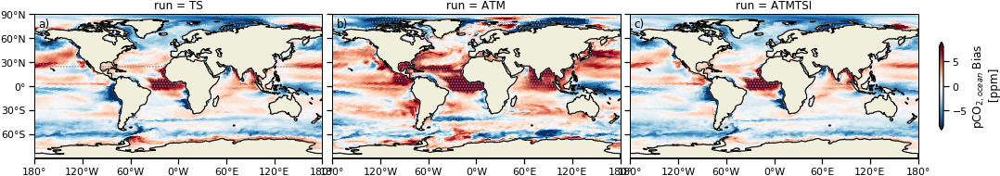

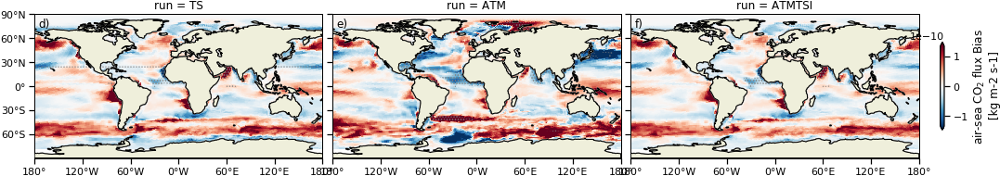

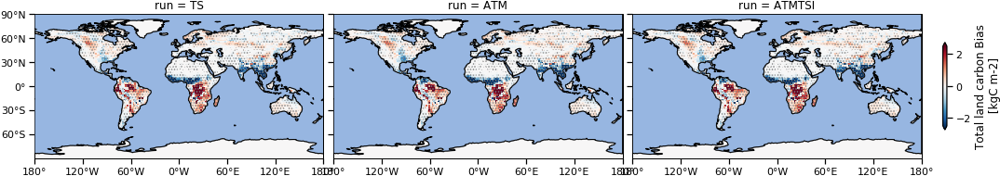

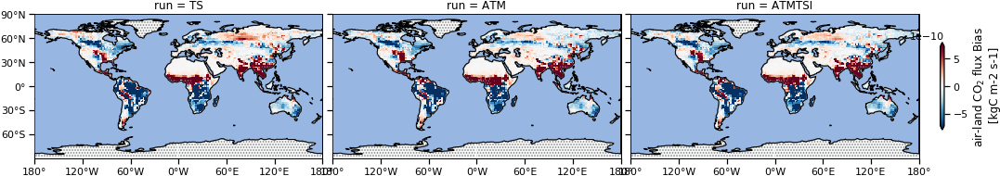

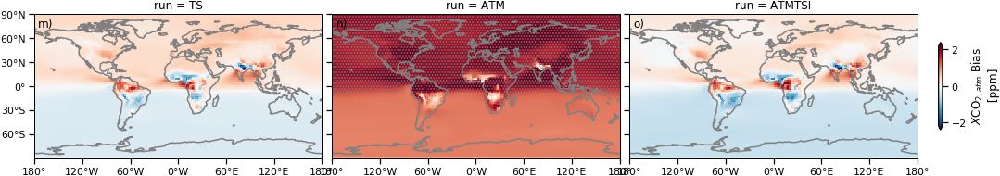

In [144]:
fg = (
    set_longitude_latitude(tp[varlist_carbon[:no_ocean_carbon_vars]])
    .sel(metric="bias")
    .map(plot_map_contour, feature=None)
)
fg = (
    set_lon_lat(tp[varlist_carbon[no_ocean_carbon_vars:]])
    .sel(metric="bias")
    .map(plot_map_contour, feature="land")
)
merge(metric="bias", new_name=new_name, contour="std")

#### ACC

In [145]:
# v = "co2_flx_land"

# tp[v].sel(metric="pearson_r", run="ATMTSI").plot_map(vmin=0.6, vmax=1)

# rt_pearson_r[v].plot_map(vmin=0.6, vmax=1)

# rt_pearson_r = set_longitude_latitude(rt_pearson_r)

# tp[v].sel(metric="pearson_r", run="ATMTSI").where(
#    tp[v].sel(metric="pearson_r", run="ATMTSI") > rt_pearson_r[v]
# ).plot_map(vmin=0.6, vmax=1)

In [198]:
# tried to replace
def plot(tp, rt_pearson_r, metric="pearson_r"):
    import cartopy.crs as ccrs

    fig, axis = plt.subplots(
        len(tp.data_vars),
        tp.run.size,
        figsize=(15, 15),
        sharex=True,
        sharey=True,
        subplot_kw=dict(projection=ccrs.PlateCarree()),
    )
    if metric is not None:
        tp = tp.sel(metric=metric, drop=True)

    for i, v in enumerate(list(tp.data_vars)[::-1]):
        for j, r in enumerate(tp.run):
            ax = axis[i, j]
            vminmax = tp[v].quantile(
                q=[0.02, 0.98], dim=[d for d in tp[v].dims], skipna=True,
            )
            vmin = vminmax.isel(quantile=0)
            vmax = vminmax.isel(quantile=1)
            print("plot", v, tp.sel(run=r)[v].dims)

            if v in ["fgco2", "spco2"]:
                feature = "land"
            elif v in ["box_Cpools_total", "co2_flx_land"]:
                feature = "ocean"
            else:
                feature = None
            tp.sel(run=r)[v].plot_map(
                cbar_kwargs=None,  # {"shrink": 0.5} if j == 2 else None,
                robust=True,
                vmin=vmin,
                vmax=vmax,
                ax=ax,
                feature=feature,
                add_colorbar=False,  # True if j == 2 else False,
            )
            # if j == 2:
            #    ax.colorbar()

    # for ax in axis.flatten():
    #    ax.coastlines()


# plot(tp, rt_pearson_r)

'map_pearson_r_carbon_contour_95th.png'

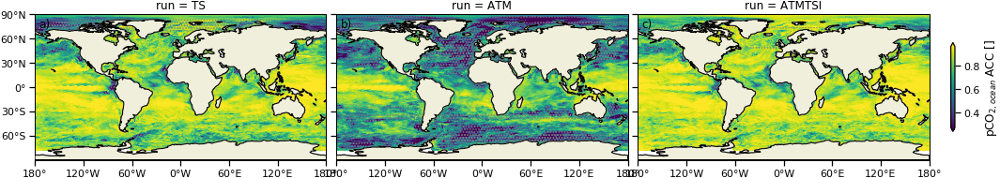

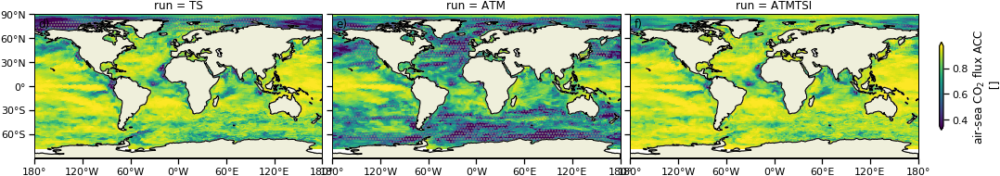

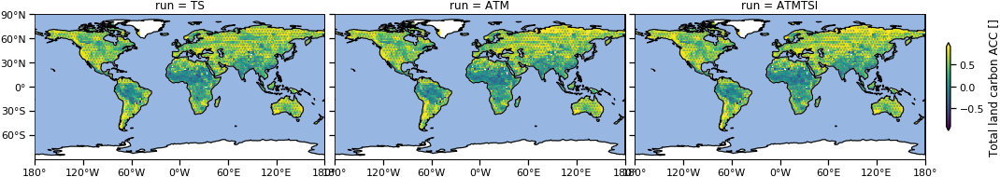

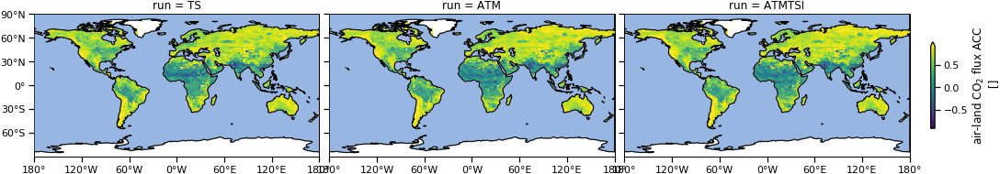

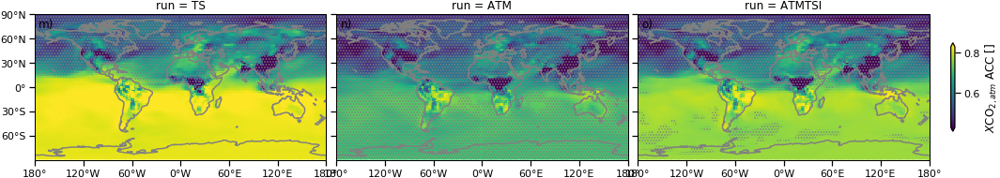

In [146]:
metric = "pearson_r"
_ = (
    set_longitude_latitude(tp[varlist_carbon[:no_ocean_carbon_vars]])
    .sel(metric=metric)
    .map(plot_map_contour)
)
_ = (
    set_lon_lat(tp[varlist_carbon[no_ocean_carbon_vars:]])
    .sel(metric=metric)
    .map(plot_map_contour)
)
merge(metric=metric, new_name=new_name, contour="95th")

#### rmse

'map_rmse_carbon_contour_5th.png'

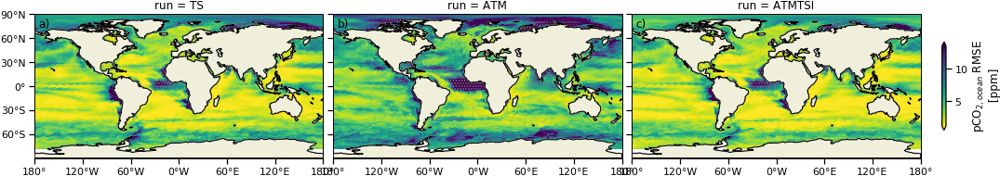

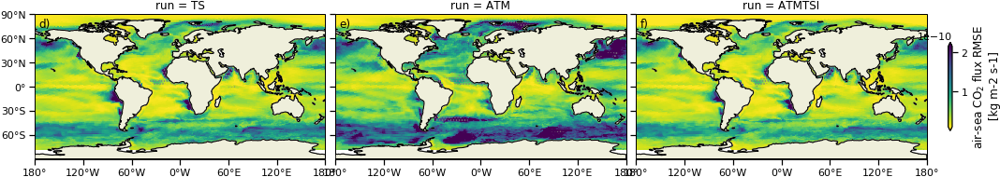

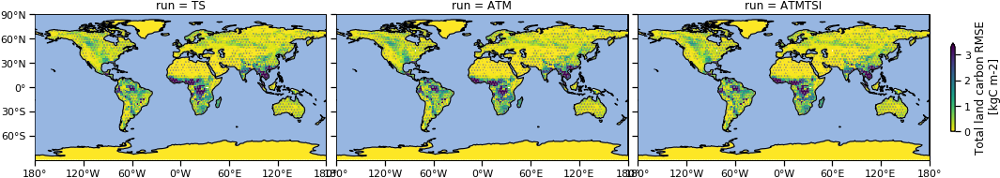

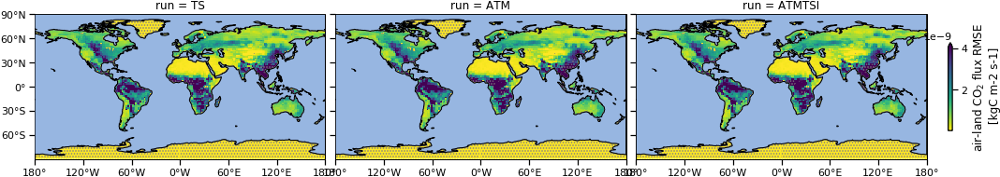

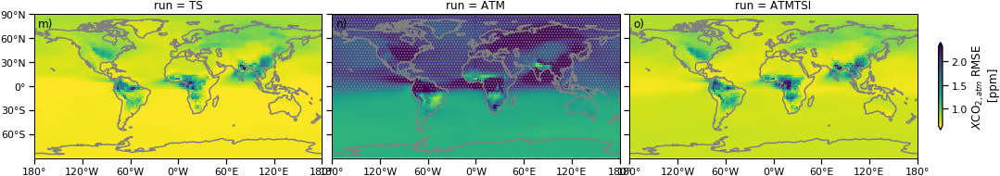

In [147]:
metric = "rmse"
_ = (
    set_longitude_latitude(tp[varlist_carbon[:no_ocean_carbon_vars]])
    .sel(metric=metric)
    .map(plot_map_contour, feature="land")
)
_ = (
    set_lon_lat(tp[varlist_carbon[no_ocean_carbon_vars:]])
    .sel(metric=metric)
    .map(plot_map_contour, feature=feature)
)
merge(metric=metric, new_name=new_name, contour="5th")

#### unbiased rmse

In [148]:
cut = CUT
dszym_debiased = debias(dszym, cut=CUT, how=how_debias)
# tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()
tp_debiased = (
    dszym_debiased.map(metrics_over_time, metrics=run_metrics).mean("time").compute()
)

'map_debiased_rmse_carbon_contour_5th.png'

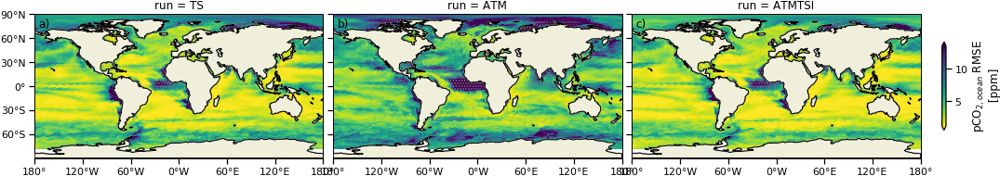

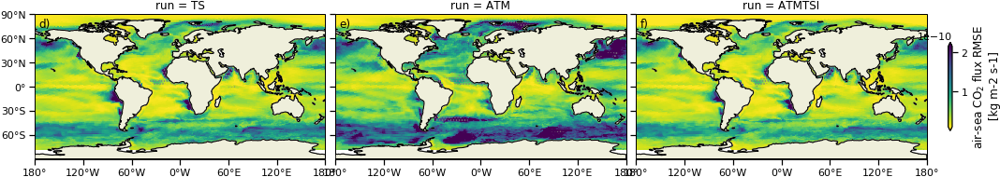

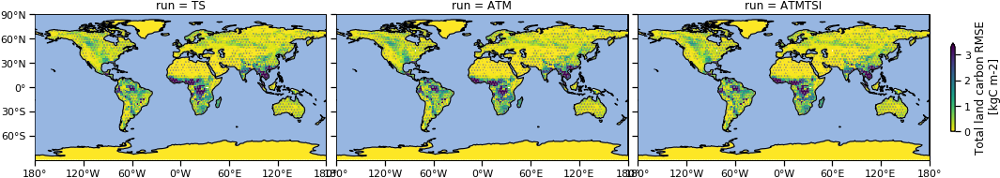

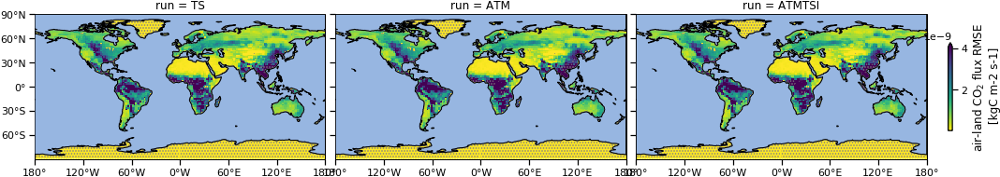

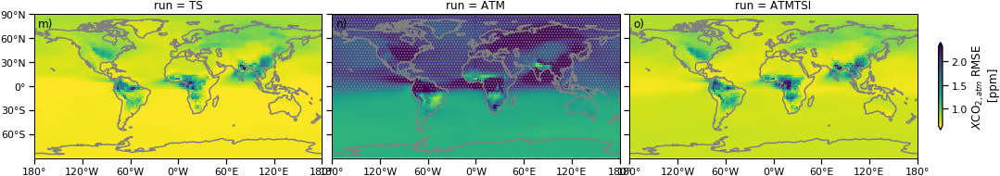

In [149]:
# _ = tp.sel(metric=metric).map(plot_map_contour, feature=feature)
_ = (
    set_longitude_latitude(tp[varlist_carbon[:no_ocean_carbon_vars]])
    .sel(metric=metric)
    .map(plot_map_contour, feature="land")
)
_ = (
    set_lon_lat(tp[varlist_carbon[no_ocean_carbon_vars:]])
    .sel(metric=metric)
    .map(plot_map_contour, feature=feature)
)
merge(metric="debiased_rmse", new_name=new_name, contour="5th")

## global aggregated (Spring 2021 Fig. 6)

direct indirect (manuscript plots)

In [151]:
oceanvarlist_mbgc = ["spco2", "fgco2"]
varlist_tbgc = ["lai", "ws", "box_Cpools_total", "co2_flx_land"]

In [152]:
runs_selected = [c, indirect_run, direct_run]
runs_selected

['vga0220a_Rerun', 'ATMTSI', 'ATMTSIDICALKlandr']

In [153]:
iterations = 500

In [154]:
# ocean
print(f"get {oceanvarlist_mbgc}")
dsz = xr.open_zarr(ocean_zarr)[oceanvarlist_mbgc]
dsz = clean(convert_C(dsz)).sel(run=runs_selected)

dszr = dsz.map(global_agg, keep_attrs=True).compute()

get ['spco2', 'fgco2']
converted spco2 from Pa to ppm


In [155]:
# land
print(f"get {varlist_tbgc}")
dsz = xr.open_zarr(atm_zarr)[varlist_tbgc + ["CO2"]]
dsz = clean(convert_C(dsz)).sel(run=runs_selected)

get ['lai', 'ws', 'box_Cpools_total', 'co2_flx_land']
converted CO2 from kg kg-1 to ppm
converted co2_flx_land from CO2 units to C units.
converted box_Cpools_total from mol(CO2) to kgC


In [156]:
dszr = dszr.update(dsz.map(global_agg, keep_attrs=True, area=land_area).compute())

In [157]:
dszr = dszr.expand_dims("region")
dszr["region"] = ["global"]

In [158]:
dszr = dszr.map(kgC_s_to_PgC_month, keep_attrs=True)

converted Surface downward mass flux of carbon dioxide expressed as carbon
converted total upward land C flux (acc.)


In [159]:
# save output
dszr.to_netcdf("dszr.nc")

### Fig. 6

In [160]:
# monthly
show_vars = ["spco2", "fgco2", "box_Cpools_total", "co2_flx_land", "CO2"]

dszrm = split_into_months(dszr)
tpm = (
    metrics_over_time(dszrm, metrics=run_metrics)
    .squeeze(drop=True)[show_vars]
    .map(add_showname)
    .map(latexify_units)
)
tpm["run"] = ["indirect", "direct"]
tpm["metric"] = ["Bias", "MAE", "ACC", "RMSE"]
rtm = resample_target_metrics(dszrm, metrics=run_metrics, iterations=iterations)[
    show_vars
]
rtm["metric"] = ["Bias", "ACC", "RMSE"]

# debiased
dszrm_debiased = debias(dszrm, how="mean", cut=CUT)
tpm_debiased = metrics_over_time(dszrm_debiased, metrics=run_metrics).squeeze(
    drop=True
)[show_vars]
tpm_debiased["run"] = ["indirect", "direct"]

In [161]:
# annual
dszrym = yearmean(dszr)
tpa = metrics_over_time(dszrym, metrics=run_metrics).squeeze(drop=True)[show_vars]
tpa["run"] = ["indirect", "direct"]
tpa["metric"] = ["Bias", "MAE", "ACC", "RMSE"]
rta = resample_target_metrics(
    dszrym, metrics=run_metrics, iterations=iterations
).squeeze(drop=True)[show_vars]
rta["metric"] = ["Bias", "ACC", "RMSE"]

# annual debiased
dszrym_debiased = debias(dszrym, how=how_debias, cut=CUT)
tpa_debiased = metrics_over_time(dszrym_debiased, metrics=run_metrics)
tpa_debiased["run"] = ["indirect", "direct"]
tpa_debiased["metric"] = ["Bias", "MAE", "ACC", "RMSE"]

In [162]:
# gather df for seaborn catplot
# use mae as bias threshold

df = tpm.to_dataframe()

df = df.unstack(0).unstack(0).unstack(0)

df = df.melt()

df.columns = ["variable", "metric", "month", "reconstruction", "value"]

In [163]:
# add resampled
## annual
resa = xr.concat(
    [
        rta.squeeze(drop=True)
        .sel(metric=["ACC"])
        .quantile(dim="iteration", q=0.95, skipna=True),
        rta.squeeze(drop=True)
        .drop_sel(metric="ACC")
        .quantile(dim="iteration", q=0.05, skipna=True),
    ],
    "metric",
).expand_dims("iteration")
del resa["quantile"]
# monthly
res = xr.concat(
    [
        rtm.squeeze(drop=True)
        .sel(metric=["ACC"])
        .quantile(dim="iteration", q=0.95, skipna=True),
        rtm.squeeze(drop=True)
        .drop_sel(metric="ACC")
        .quantile(dim="iteration", q=0.05, skipna=True),
    ],
    "metric",
).expand_dims("iteration")
del res["quantile"]

df2 = res.to_dataframe().unstack().unstack().melt()
df2["run"] = "resampled"

df2.columns = ["variable", "month", "metric", "value", "reconstruction"]

df = pd.concat([df, df2])

In [164]:
# add perfect
df3 = xr.concat(
    [
        xr.ones_like(rtm.squeeze(drop=True).sel(metric=["ACC"]).isel(iteration=0)),
        xr.zeros_like(rtm.squeeze(drop=True).drop_sel(metric="ACC").isel(iteration=0)),
    ],
    "metric",
).expand_dims("iteration")

del df3["run"]

df3 = df3.to_dataframe().unstack().unstack().melt()
df3["run"] = "perfect"

df3.columns = ["variable", "month", "metric", "value", "reconstruction"]

df = pd.concat([df, df3])

CPU times: user 35.7 s, sys: 1.09 s, total: 36.8 s
Wall time: 28.2 s


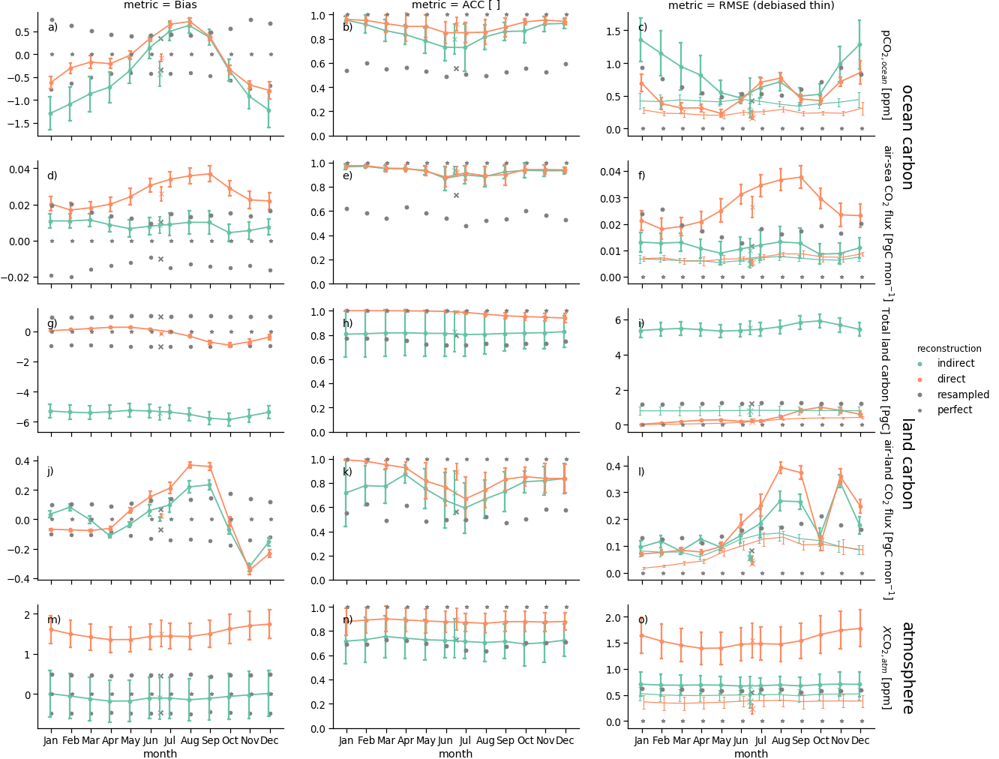

In [165]:
%%time

sns.set_context("notebook", font_scale=1.2, rc={"lines.linewidth": 1.25})

sns.set_palette(
    sns.color_palette([c_dict["indirect"], c_dict["direct"], c_dict["perfect"],c_dict["perfect"]])
)

g = sns.catplot(
    data=df,
    kind="point",
    sharex=True,
    sharey=False,
    margin_titles=True,
    x="month",
    y="value",
    hue="reconstruction",
    hue_order=["indirect", "direct", "resampled",'perfect'],
    col="metric",
    col_order=["Bias", "ACC", "RMSE"],
    row="variable", row_order=['spco2','fgco2','box_Cpools_total','co2_flx_land','CO2'], #change variables here
    linestyles=["-", "-", "",""], # dont show line for resampled and perfect 
    markers=["o", "o", "o",'*'], # perfect as star
    scale=.8,
    legend_out=True,
    dodge=0.1,
    capsize=0.1,
    #n_boot=10,ci=.96, # bootstrapping in seaborn # dont use
    ci="sd", # take standard deviation, no bootstrapping in seaborn
    height=2.9,
    aspect=2,  # change figsize
)
an_lw=2
an_marker='x'
for i, axis in enumerate(g.axes):
    for j, ax in enumerate(axis):
        m = g.axes[0][j].get_title().replace('metric = ','')
        v = g.axes[i][-1].texts[0].get_text().replace('variable = ','')
        # print(m,v)
        ## add annual
        # skill
        for k,run in enumerate(tpa.run.values):
            run=str(run)
            an = tpa.sel(metric=m,run=run,drop=True)[v]
            ax.errorbar(
                6.5-1+k*0.1-0.05,
                an.mean('time'),
                yerr=[[an.std('time')], [an.std('time')]],
                c=c_dict[run],
                lw=an_lw,
                marker=an_marker,
                capsize=2,
                capthick=an_lw,
                elinewidth=an_lw,
                label='annual'
            )
        # resampled
        an = resa.sel(metric=m,drop=True)[v]
        ax.scatter(
            6.5-1,
            an,
            c=c_dict['perfect'],
            lw=an_lw,
            marker=an_marker,
        )
        #if m=='Bias' and v=='spco2':
        #    ax.legend()
        if m == 'Bias':
            # add negative resampled boundary
            ax.scatter(res.month-1,(res.sel(metric='Bias')[v].squeeze()*-1),c=c_dict['perfect'],marker='o',s=20)
            ax.scatter(
                6.5-1,
                an*-1,
                c=c_dict['perfect'],
                lw=an_lw,
                marker=an_marker,
            )
        if m == 'RMSE':
            # set margin_titles with units
            plt.setp(ax.texts, text=f'{tpm[v].attrs["showname"]} [{tpm[v].attrs["units"]}]')
        if m =='ACC':
            # set all ACC axis y to min,max
            ax.set_ylim([0,1.02])

        if m == 'RMSE':
            # add debiased
            for k,run in enumerate(tpm_debiased.run.values):
                run=str(run)
                db = tpm_debiased.sel(metric='rmse',run=run,drop=True)[v]
                ax.errorbar(
                    db.month+k*0.2-0.1,
                    db.mean('time'),
                    yerr=[db.std('time'), db.std('time')],
                    c=c_dict[run],
                    capsize=2,
                )
            # annual
            for k,run in enumerate(tpa_debiased.run.values):
                run=str(run)
                an = tpa_debiased.sel(metric=m,run=run,drop=True)[v]
                ax.errorbar(
                    6.5-1+k*0.1-0.05,
                    an.mean('time'),
                    yerr=[[an.std('time')], [an.std('time')]],
                    c=c_dict[run],
                    lw=an_lw,
                    marker=an_marker,
                    markersize=8,
                    capsize=2,
                    capthick=an_lw,
                    elinewidth=an_lw,
                    label='annual'
                )
            

g.axes[0][2].set_title('metric = RMSE (debiased thin)')
g.axes[0][1].set_title('metric = ACC [ ]')

# delete value
g.set_ylabels("")

# rename xlabels
#g.set_xticklabels("JFMAMJJASOND")
g.set_xticklabels(["Jan",'Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov',"Dec"])

# add annotations
kw = dict(
            xycoords="figure fraction", va="center", rotation=270, fontsize="x-large"
        )
plt.annotate("ocean carbon", (0.9, 0.82),**kw)
plt.annotate("land carbon", (0.9, 0.39),**kw)
plt.annotate("atmosphere", (0.9, 0.12),**kw)
# add labels like a)
add_figurelabels(g.axes, pad=0.8, labels="abcdefghijklmnopqrstuvwxyz")
g.fig.subplots_adjust(wspace=0.2, hspace=0.2)
plt.savefig(
    "metrics_month_in_direct_carbon_region_global.png",
    transparent=True,
    bbox_inches="tight",
    pad_inches=0,
)

# Ideas:
# add climatology? (Istvan), +: good to understand mean seasonality, -: quite messy

# FINISH

In [27]:
client.close()

# ...

# former code

## global aggregates carbon

#### months

In [58]:
dszrm = split_into_months(dszr)

tpm = metrics_over_time(dszrm, metrics=run_metrics).mean("time")

rtm = resample_target_metrics(dszrm, metrics=run_metrics, iterations=iterations)

#### annual

In [59]:
dszrym = yearmean(dszr)

tpa = metrics_over_time(dszrym, metrics=run_metrics).mean("time")

rta = resample_target_metrics(dszrym, metrics=run_metrics, iterations=iterations)

#### rm bias

In [61]:
dszrm_debiased = debias(dszrm, how="mean", cut=CUT)

tpm_debiased = metrics_over_time(dszrm_debiased, metrics=run_metrics).mean("time")

#### annual rm bias

In [63]:
dszrym_debiased = debias(dszrym, how=how_debias, cut=CUT)

tpa_debiased = metrics_over_time(dszrym_debiased, metrics=run_metrics).mean("time")

#### plot

In [64]:
new_name = "carbon"

In [ ]:
direct_runs = [direct_run, "ATMTSIDICALKland2", "ATMTSIDICALKlandR"]

sns.set_palette("Set2", 2)

# tried to replace, successfully
def plot_annual(
    tpa,
    rta,
    name,
    metric,
    region,
    indirect_run,
    direct_run,
    q,
    ax,
    marker="X",
    c="gray",
):
    markersize = 10
    # resampled
    ax.plot(
        6.5,
        rta.sel(metric="mae" if metric == "bias" else metric, region=region)[
            name
        ].quantile(q, "iteration"),
        marker=marker,
        c=c,
    )
    if metric == "bias":
        ax.plot(
            6.5,
            rta.sel(metric="mae", region=region)[name].quantile(q, "iteration") * -1,
            marker=marker,
            c=c,
        )
    # skill
    ax.plot(
        6.5,
        tpa.sel(metric=metric, run=indirect_run, region=region)[name],
        marker=marker,
        markersize=markersize,
        c="white",
    )
    ax.plot(
        6.5,
        tpa.sel(metric=metric, run=indirect_run, region=region)[name],
        marker=marker,
    )
    ax.plot(
        6.5,
        tpa.sel(metric=metric, run=direct_run, region=region)[name],
        marker=marker,
        markersize=markersize,
        c="white",
    )
    ax.plot(
        6.5, tpa.sel(metric=metric, run=direct_run, region=region)[name], marker=marker
    )


def plot_metric_over_month_indirect_direct(
    r,
    metric,
    region="global",
    indirect_run="ATMTSI",
    direct_run="ATMTSIDICALK",
    ax=None,
    show_title=False,
    set_ylabel=True,
    unbiased=None,
    annual=None,
    unbiased_annual=None,
):
    # plotting
    if ax is None:
        ax = plt.gca()
    name = r.name
    longname = r.attrs["long_name"]
    # select data
    if region is not None:
        r = r.sel(region=region)
        rtmr = rtm.sel(region=region)
        if isinstance(rtmr, xr.Dataset):
            rtmr = rtmr[name]
        titlestr_here = f"{v}: {region}"
    else:
        titlestr_here = v
        rtmr = rtm
    if "metric" in r.dims:
        r = r.sel(metric=metric)
    elif isinstance(r, xr.Dataset):
        if metric in r.data_vars:
            r = r[metric]
    if metric == "pearson_r":
        q = 0.95
    else:
        q = 0.05

    # plot lines
    p = (
        r.sel(run=[indirect_run, direct_run])
        .rename({"run": "reconstruction"})
        .assign_coords(
            reconstruction=("reconstruction", ["indirect BGC", "direct BGC"])
        )
        .plot(hue="reconstruction", ax=ax)
    )
    if metric in ["rmse", "mae"] and unbiased is not None:
        unbiased["month"] = r.month
        u = (
            unbiased[name]
            .sel(metric=metric, region=region, run=[indirect_run, direct_run])
            .rename({"run": "reconstruction"})
            .assign_coords(
                reconstruction=("reconstruction", ["indirect BGC", "direct BGC"])
            )
        )
        u["reconstruction"] = [f"debiased {r.values}" for r in u.reconstruction]
        u.plot(hue="reconstruction", ls="--", add_legend=True, ax=ax)

    # plot annual
    if annual is not None:
        plot_annual(annual, rta, name, metric, region, indirect_run, direct_run, q, ax)
    if unbiased_annual is not None and metric in ["rmse", "mae"]:
        plot_annual(
            unbiased_annual,
            rta,
            name,
            metric,
            region,
            indirect_run,
            direct_run,
            q,
            ax,
            marker="x",
        )

    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(months)
    ax.set_ylabel(f"{metric}")

    # plot resampled comparison
    rtmq = rtmr.quantile(q, "iteration")
    rtmq["month"] = rtmq.month.values  # - 1
    units = r.attrs["units"]
    if not set_ylabel:
        q2 = 0.90
        ymax = np.max(
            [
                abs(r.quantile(q=q2, dim="time").max("month")),
                abs(r.quantile(q=1 - q2, dim="time").min("month")),
            ]
        )
        ax.set_ylim([-ymax, ymax])
    lw = 2
    if metric == "bias":
        s = xr.zeros_like(rtmq.month).plot(
            label="target", marker="*", lw=0, color="gray", ax=ax
        )
        b = rtmq.sel(metric="mae").plot(
            label=f"random metric target", lw=lw, ls=":", color="gray", ax=ax
        )
        (rtmq * -1).sel(metric="mae").plot(
            label=f"random metric target", lw=lw, ls=":", color="gray", ax=ax
        )
    elif metric == "pearson_r":
        if set_ylabel:
            ax.set_ylim([0, 1.02])
        # plot stars at ACC=1
        s = xr.ones_like(rtmq.month).plot(
            label="target", marker="*", lw=0, color="gray", ax=ax
        )
        # plot gray line for resampled target correlation
        b = rtmq.sel(metric=metric).plot(
            label=f"random metric target", lw=lw, ls=":", color="gray", ax=ax
        )
    elif metric == "rmse":
        # plot stars at RMSE=0
        s = xr.zeros_like(rtmq.month).plot(
            label="target", marker="*", lw=0, ls=":", color="gray", ax=ax
        )
        # plot std target
        # std2.sel(run=c).plot(label="time std target", lw=1, ls=":", color="gray", ax=ax)
        # plot gray line for resampled target rmse
        b = rtmq.sel(metric=metric).plot(
            label=f"random metric target", lw=lw, ls=":", color="gray", ax=ax
        )
    if metric == "pearson_r":
        units = ""
    ax.set_ylabel(f"{metric_shortname[metric]} [{units}]")
    ax.set_title(f"variable = {name}, region = {region}")
    ax.set_title("")
    sns.despine()
    # ax.legend(handles=[s,b],labels=['target','bootstrapped'])
    return ax  # plt.show()


from copy import copy


def plot_plot_metric_over_month_indirect_direct_many(
    tpm,
    expand="data_vars",
    region="global",
    savefig=True,
    label="",
    indirect_run="ATMTSI",
    direct_run="ATMTSIDICALK",
    pub_ready=False,
    legendi=0,
    rowlabel=None,
    rowx=None,
    rowy=None,
):
    expand_ori = copy(expand)
    if expand == "data_vars" and isinstance(tpm, xr.Dataset):
        expand = list(tpm.data_vars)
    elif (
        expand == "region"
        and isinstance(region, list)
        and isinstance(tpm, xr.DataArray)
    ):
        expand = region
        name = tpm.name
    else:
        raise ValueError("check inputs")
    pmomid_kwargs = dict(
        indirect_run=indirect_run,
        direct_run=direct_run,
        annual=tpa,
        unbiased_annual=tpa_debiased,
    )
    fig, ax = plt.subplots(
        nrows=len(expand), ncols=3, figsize=(24, len(expand) * 3), sharex=True
    )
    for row, e in enumerate(expand):
        if expand_ori == "data_vars":
            ds_show = tpm[e]
            plot_metric_over_month_indirect_direct(
                ds_show, "bias", region=region, ax=ax[row, 0], **pmomid_kwargs
            )
            plot_metric_over_month_indirect_direct(
                ds_show, "pearson_r", region=region, ax=ax[row, 1], **pmomid_kwargs
            )
            plot_metric_over_month_indirect_direct(
                ds_show,
                "rmse",
                region=region,
                unbiased=tpm_debiased,
                ax=ax[row, 2],
                **pmomid_kwargs,
            )
            for j in range(3):
                ax[row, j].set_title(f"var = {e}")

        elif expand_ori == "region":
            ds_show = tpm.sel(region=[e])
            # print(row,ds_show)
            plot_metric_over_month_indirect_direct(
                ds_show, "bias", region=e, ax=ax[row, 0], **pmomid_kwargs
            )
            plot_metric_over_month_indirect_direct(
                ds_show, "pearson_r", region=e, ax=ax[row, 1], **pmomid_kwargs
            )
            plot_metric_over_month_indirect_direct(
                ds_show,
                "rmse",
                region=e,
                unbiased=tpm_debiased,
                ax=ax[row, 2],
                **pmomid_kwargs,
            )
            for j in range(3):
                ax[row, j].set_title(f"region = {e}")

    # set legends
    for i, axes_row in enumerate(ax):
        for j, axes_col in enumerate(axes_row):
            if i != len(ax) - 1:
                ax[i, j].set_xlabel("")
            if not ((i == 0 and j == 0) or (i == legendi and j == 2)):
                ax[i, j].get_legend().remove()
            if pub_ready:
                ax[i, j].set_title("")
                ax[i, j].set_ylabel("")

    if expand_ori == "data_vars":
        title_str = f"Indirect {indirect_run} vs direct {direct_run} reconstruction in region = {region}"
    elif expand_ori == "region":
        title_str = f"Indirect {indirect_run} vs direct {direct_run} reconstruction for variable = {name}"
    if len(expand_ori) >= 3:
        y = 0.93

    if pub_ready:
        ax[0, 0].set_title("Bias", fontsize="x-large")
        ax[0, 1].set_title("Anomaly Correlation Coefficient", fontsize="x-large")
        ax[0, 2].set_title("Root Mean Square Error", fontsize="x-large")
        kw = dict(
            xycoords="figure fraction", va="center", rotation=90, fontsize="x-large"
        )

        for i, l in enumerate(rowlabel):
            ax[0, 0].annotate(l, (rowx, rowy[i]), **kw)
        kw = dict(xycoords="figure fraction", va="center", rotation=90)
        x = 0.055
        vlist = list(tpm.data_vars)
        for i, v in enumerate(vlist):
            ax[i, 0].set_ylabel(f'{v} [{tpm[v].attrs["units"]}]')

    else:
        plt.suptitle(title_str, y=y)
    if savefig:
        savefig_kwargs = dict(bbox_inches="tight", pad_inches=0.1)
        if expand_ori == "data_vars":
            plt.savefig(
                f"metrics_month_in_direct_{label}_region_{region}.png", **savefig_kwargs
            )
        elif expand_ori == "region":
            plt.savefig(f"metrics_month_in_direct_{name}_{label}.png", **savefig_kwargs)


# plot_metric_over_month_indirect_direct(tpm['spco2'],'rmse',unbiased=tpm_debiased, annual=tpa, unbiased_annual=tpa_debiased)

mpl.rcParams["savefig.dpi"] = 300

sns.set_context("notebook", rc={"lines.linewidth": 3}, font_scale=1.4)

params = {
    "legend.fontsize": 14,
    "legend.handlelength": 2,
    "legend.loc": "lower right",
    "axes.linewidth": 1.4,
}
plt.rcParams.update(params)

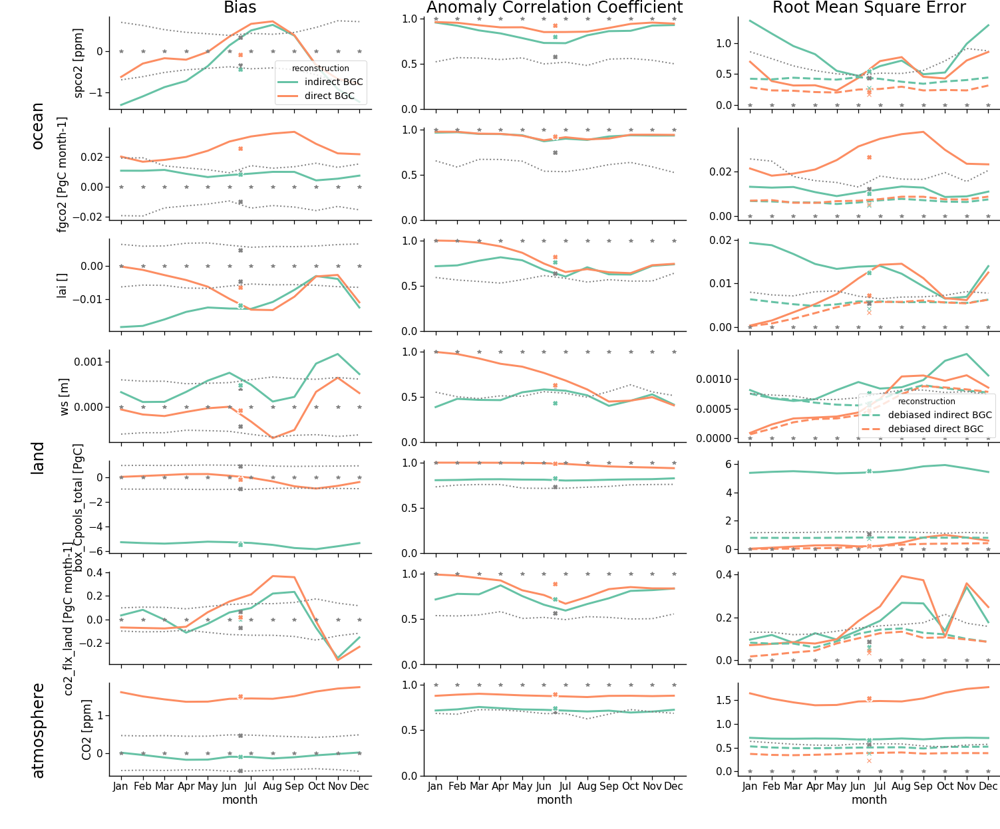

In [62]:
plot_plot_metric_over_month_indirect_direct_many(
    tpm,
    direct_run=direct_run,
    label=new_name,
    rowlabel=["ocean", "land", "atmosphere"],
    rowx=0.03,
    rowy=[0.85, 0.45, 0.12],
    pub_ready=True,
    legendi=3,
)

# SI tracking performance

In [46]:
# physics atm
# bias map for SAB # no lon, lat, only ATMTSI
# sns.set_context('talk', font_scale=.8)
# fg = tp.sel(metric="bias").sel(run=['ATMTSI']).map(plot_map_contour)
# merge(metric='bias',new_name='SAB', contour='std')
# sns.set_context('notebook')

## ocean physics

In [90]:
new_name='ocean_physics'

In [91]:
oceanvarlist_physics = [
    v for v in oceanvarlist if output_df2.loc[v]["model"] == "mpiom"
][:-1]
oceanvarlist_physics

['zmld', 'tos']

In [92]:
dsz = xr.open_zarr(ocean_zarr)[oceanvarlist_physics]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs)
dszym = yearmean(dsz).chunk({"time": -1}).persist()

#### ym tracking performance

In [93]:
mean = dszym.sel(run=c).mean("time").compute()
std = dszym.sel(run=c).std("time").compute()

%time tp = metrics_over_time(dszym, metrics=run_metrics).mean("time").compute()

CPU times: user 29.4 s, sys: 11.3 s, total: 40.7 s
Wall time: 14.7 s


In [94]:
%%time
rt_pearson_r = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='pearson_r').chunk({'iteration':-1}).quantile(.95,'iteration', skipna=True).compute()

CPU times: user 45.1 s, sys: 16.1 s, total: 1min 1s
Wall time: 41.7 s


In [77]:
rt_rmse = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='rmse').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()
rt_mae = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()

CPU times: user 43.2 s, sys: 9.99 s, total: 53.2 s
Wall time: 38.9 s


##### bias

CPU times: user 1min 53s, sys: 8.02 s, total: 2min 1s
Wall time: 18.5 s


'map_bias_ocean_physics_contour_std.png'

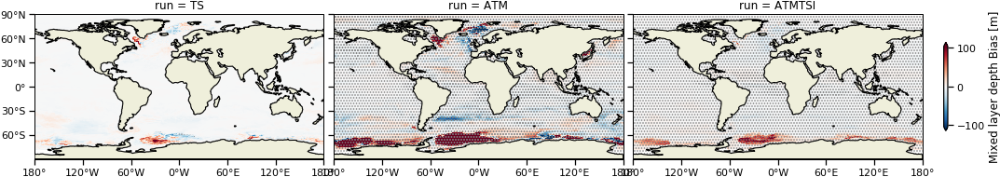

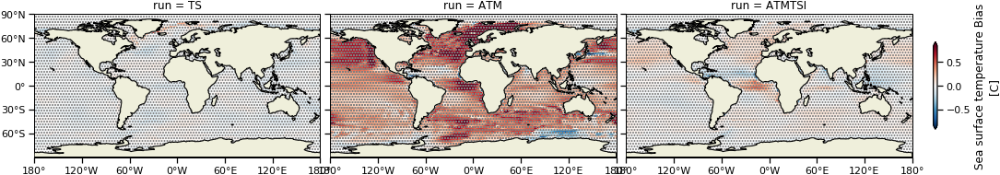

In [78]:
%%time
fg = tp.sel(metric="bias").map(plot_map_contour, feature='land')
merge(metric='bias',new_name='ocean_physics', contour='std')

##### ACC

'map_pearson_r_ocean_physics_contour_95th.png'

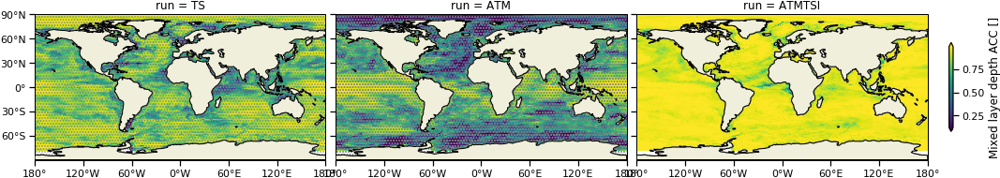

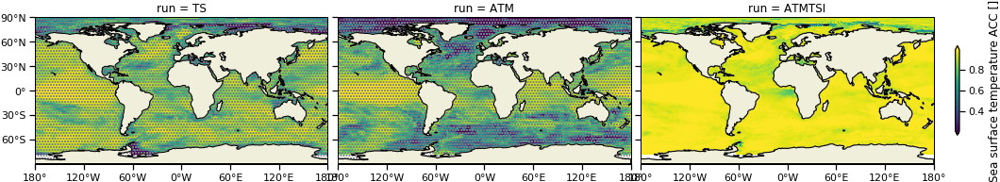

In [79]:
metric="pearson_r"
_ = tp.sel(metric=metric).map(plot_map_contour, feature='land')
merge(metric=metric,new_name=new_name, contour='95th')

##### rmse

In [ ]:
metric="rmse"
_ = tp.sel(metric=metric).map(plot_map_contour, feature='land')
merge(metric=metric,new_name=new_name, contour='5th')

##### debiased rmse

In [ ]:
dszym_debiased = debias(dszym,cut=CUT,how=how_debias)
tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

In [ ]:
_ = tp_debiased.sel(metric='rmse').map(plot_map_contour, feature='land')
merge(metric='debiased_rmse',new_name=new_name, contour='5th')

## ocean biogeochemistry

In [150]:
oceanvarlist_mbgc = ["spco2",'fgco2']

In [73]:
new_name='mbgc'

In [86]:
dsz = xr.open_zarr(ocean_zarr)[oceanvarlist_mbgc]
dsz = clean(convert_C(dsz)).sel(run=indirect_runs)
dszym = yearmean(dsz).chunk({"time": -1}).persist()

for v in long_name_rename_dict.keys():
    if v in dszym.data_vars:
        dszym[v].attrs['long_name'] = long_name_rename_dict[v]

converted spco2 from Pa to ppm


### ym tracking performance maps

In [87]:
mean = dszym.sel(run=c).mean("time").compute()
std = dszym.sel(run=c).std("time").compute()

tp = metrics_over_time(dszym, metrics=run_metrics).mean("time").compute()

In [88]:
rt_pearson_r = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='pearson_r').chunk({'iteration':-1}).quantile(.95,'iteration', skipna=True).compute()
rt_rmse = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='rmse').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()
rt_mae = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()

#### bias
ATM nuding brings regional mean bias

'map_bias_mbgc_contour_std.png'

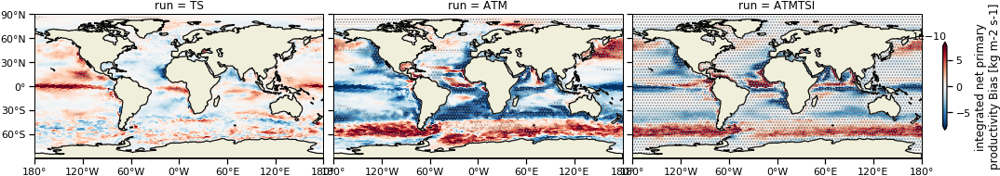

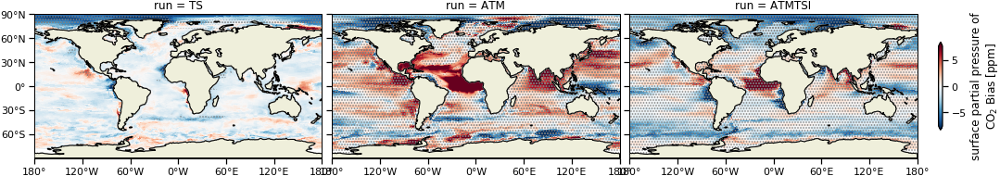

In [89]:
fg = tp.sel(metric="bias").map(plot_map_contour, feature='land')
merge(metric='bias',new_name=new_name, contour='std')

CPU times: user 1min 58s, sys: 8.83 s, total: 2min 7s
Wall time: 23.9 s


'map_bias_mbgc_contour_std.png'

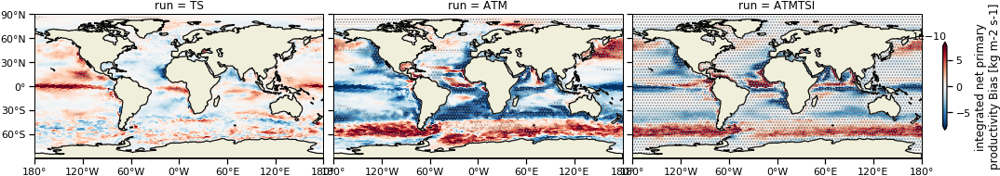

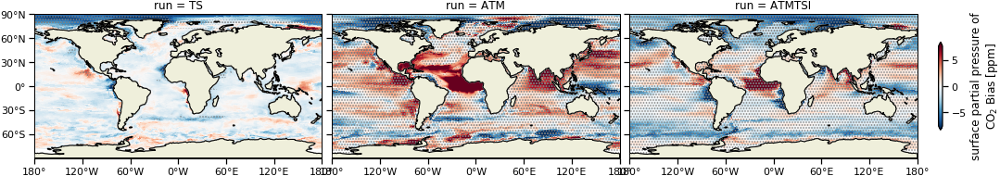

In [90]:
%%time
fg = tp.sel(metric="bias").map(plot_map_contour, feature='land')
merge(metric='bias',new_name=new_name, contour='std')

#### ACC

'map_pearson_r_mbgc_contour_95th.png'

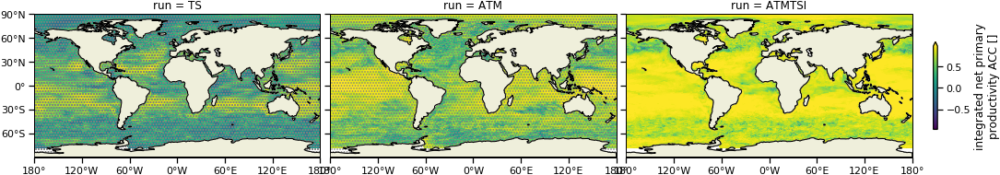

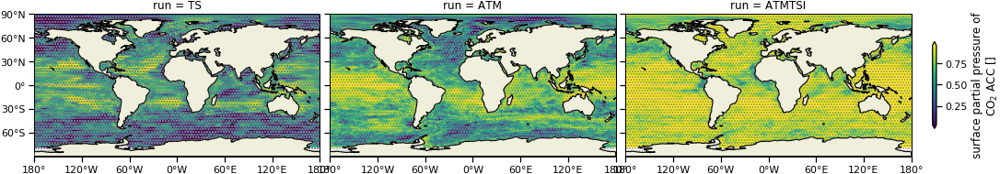

In [91]:
metric="pearson_r"
_ = tp.sel(metric=metric).map(plot_map_contour, feature='land')
merge(metric=metric,new_name=new_name, contour='95th')

#### rmse

'map_rmse_mbgc_contour_5th.png'

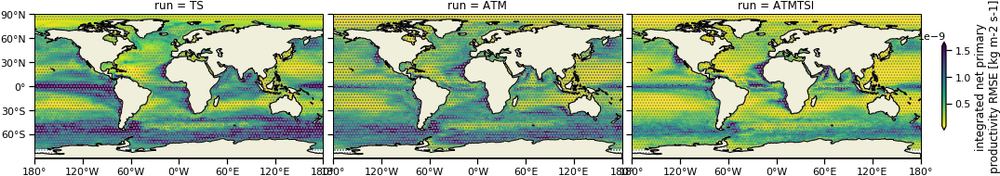

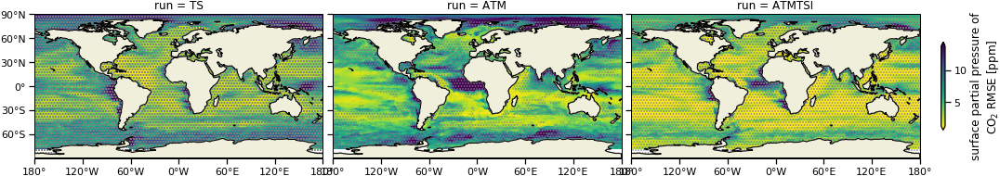

In [92]:
metric="rmse"
_ = tp.sel(metric=metric).map(plot_map_contour, feature='land')
merge(metric=metric,new_name=new_name, contour='5th')

#### debiased rmse

In [93]:
dszym_debiased = debias(dszym,cut=CUT,how=how_debias)
tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

'map_debiased_rmse_mbgc_contour_5th.png'

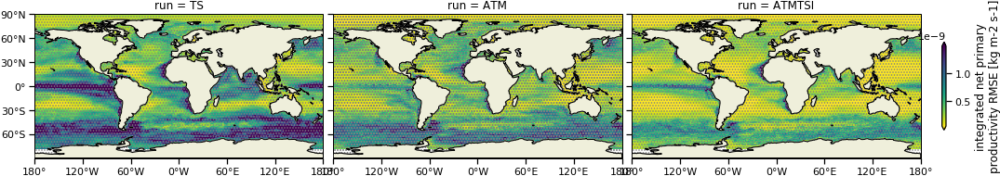

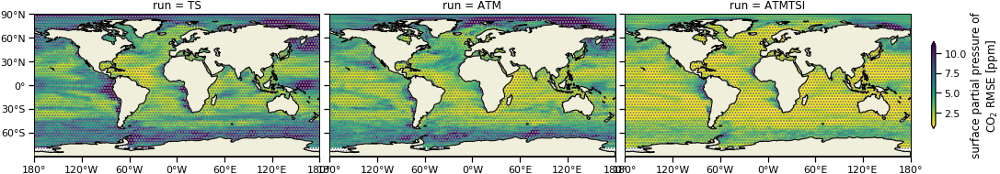

In [94]:
_ = tp_debiased.sel(metric='rmse').map(plot_map_contour, feature='land')
merge(metric='debiased_rmse',new_name=new_name, contour='5th')

## terrestrial biogeochemistry

In [122]:
varlist_tbgc = [v for v in atmvarlist if output_df2.loc[v]["model"] in ["jsbach",'echam6']]
varlist_tbgc

['wind10',
 'u10',
 'v10',
 'temp2',
 'CO2',
 'co2_flux',
 'co2_flx_ocean',
 'co2_flx_land',
 'precip',
 'co2_flx_npp',
 'co2_flx_resp',
 'tsw',
 'slp',
 'ws',
 'lai',
 'box_Cpools_total']

In [123]:
# get Total Carbon in all Terrestrial Carbon Pools [Gt]

In [149]:
varlist_tbgc = ['lai','ws','box_Cpools_total','co2_flx_land']

In [132]:
new_name='tbgc'
feature='ocean'

In [126]:
dsz = xr.open_zarr(atm_zarr)[varlist_tbgc]
dsz = clean(convert_C(dsz)).sel(run=indirect_run)
dszym = yearmean(dsz).chunk({"time": -1}).persist()

for v in long_name_rename_dict.keys():
    if v in dszym.data_vars:
        dszym[v].attrs['long_name'] = long_name_rename_dict[v]

converted co2_flx_land from CO2 units to C units.
converted box_Cpools_total from mol(CO2) to kgC


### ym tracking performance maps

In [127]:
#mean = dszym.sel(run=c).mean("time").compute()
#std = dszym.sel(run=c).std("time").compute()
%time tp = metrics_over_time(dszym, metrics=run_metrics).mean("time").compute()

CPU times: user 34.6 s, sys: 6.94 s, total: 41.5 s
Wall time: 24.7 s


In [128]:
%time rt_pearson_r = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='pearson_r').chunk({'iteration':-1}).quantile(.95,'iteration', skipna=True).compute()
rt_rmse = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='rmse').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()
rt_mae = resample_target_metrics(dszym, metrics=run_metrics,iterations=iterations).sel(metric='mae').chunk({'iteration':-1}).quantile(.05,'iteration', skipna=True).compute()

CPU times: user 35.7 s, sys: 5.03 s, total: 40.7 s
Wall time: 27.4 s


#### bias
ATM nuding brings regional mean bias

In [ ]:
%%time
fg = tp.sel(metric="bias").map(plot_map_contour, feature=feature)
merge(metric='bias',new_name=new_name, contour='std')

#### ACC

'map_pearson_r_tbgc_contour_95th.png'

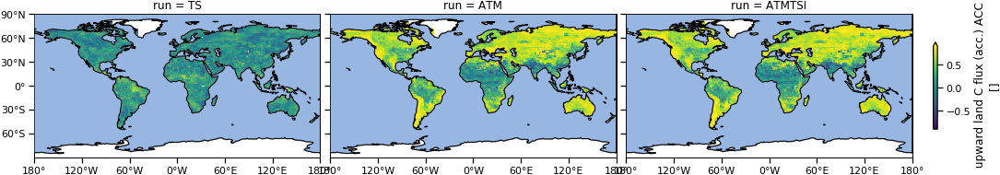

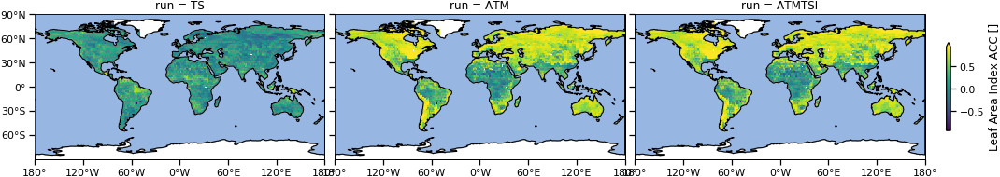

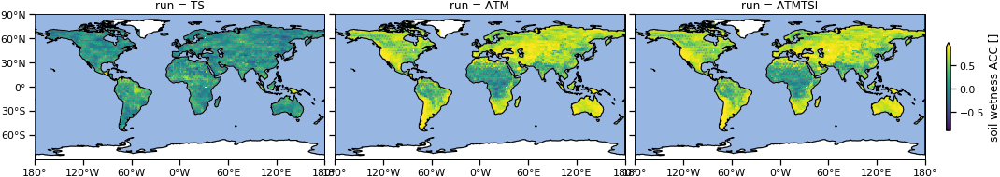

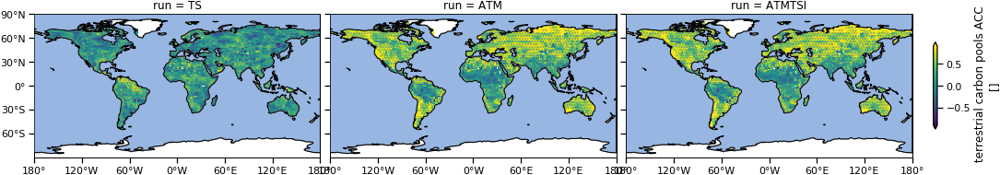

In [130]:
metric="pearson_r"
_ = tp.sel(metric=metric).map(plot_map_contour, feature=feature)
merge(metric=metric,new_name=new_name, contour='95th')

#### rmse

'map_rmse_tbgc_contour_5th.png'

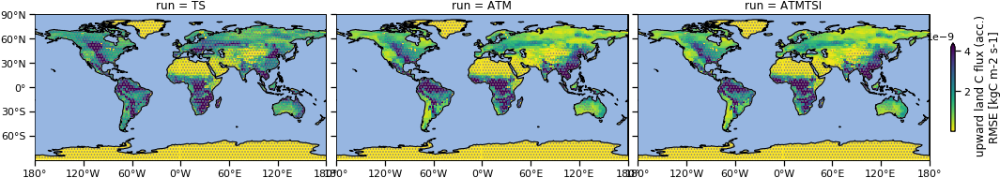

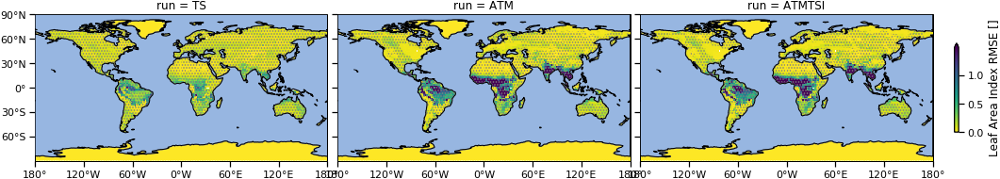

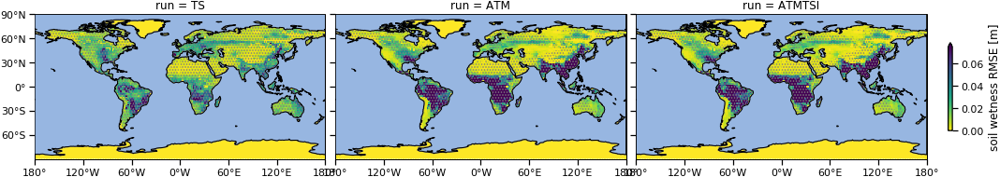

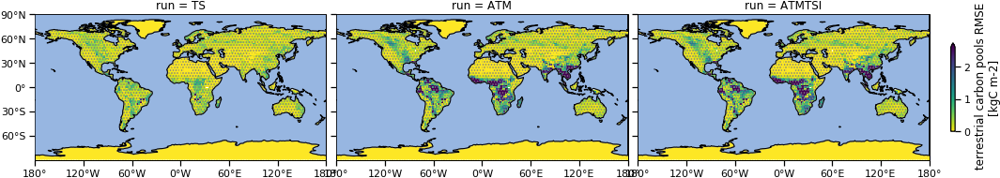

In [131]:
metric="rmse"
_ = tp.sel(metric=metric).map(plot_map_contour, feature=feature)
merge(metric=metric,new_name=new_name, contour='5th')

#### unbiased rmse

In [132]:
dszym_debiased = debias(dszym,cut=CUT,how=how_debias)
%time tp_debiased = metrics_over_time(dszym_debiased, metrics=run_metrics).mean("time").compute()

CPU times: user 3min 5s, sys: 38 s, total: 3min 43s
Wall time: 2min 30s


'map_debiased_rmse_tbgc_contour_5th.png'

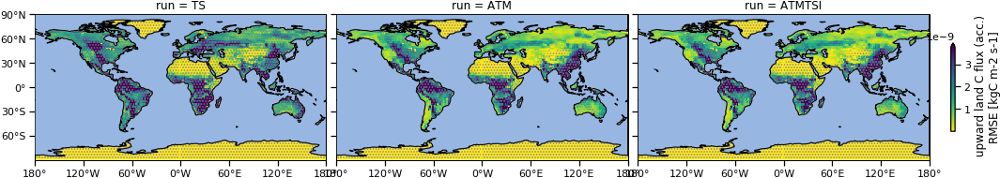

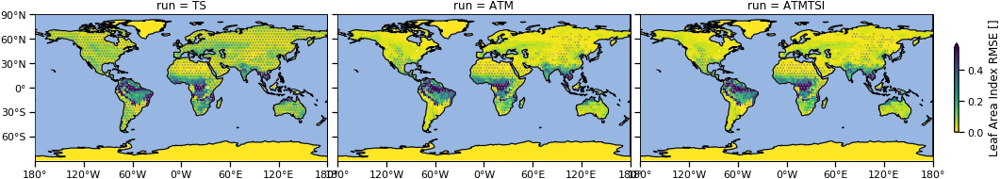

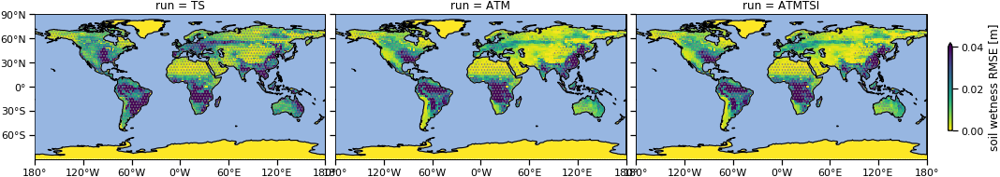

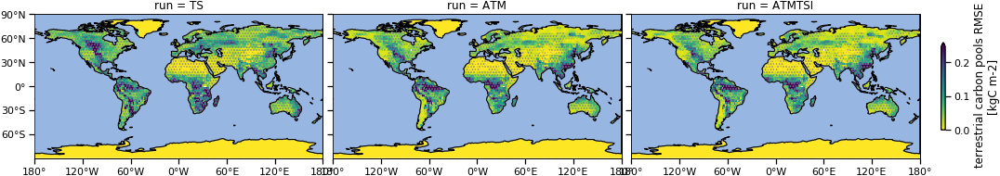

In [133]:
_ = tp_debiased.sel(metric='rmse').map(plot_map_contour, feature=feature)
merge(metric='debiased_rmse',new_name=new_name, contour='5th')

## Misc

In [67]:
run_carbon = [c,'TS','ATM','ATMTSI','ATMTSIDICALK','ATMTSIDICALKNUT','ATMTSIlandrall','ATMTSIDICALKlandr','ATMTSIDICALKlandR','ATMTSIDICALKland2']

In [70]:
#land_unit = land_area / land_area
#lat_30_mask = land_unit.where(land_area.lat>30,other=0)+(land_unit*2).where(land_area.lat<-30,other=0)
#lat_30_mask.plot()

#dszr = to_regions(dsz, mask=lat_30_mask)

#dszr = dszr.sel(region=[1,0,2])
#dszr['region']=['90N-30N','30N-30S','30S-90S']

#%time dszr = dszr.compute()

In [ ]:
### different direct_runs

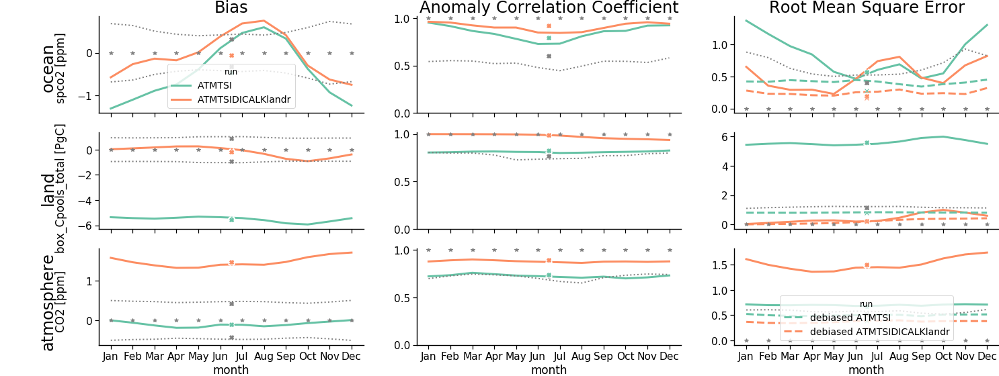

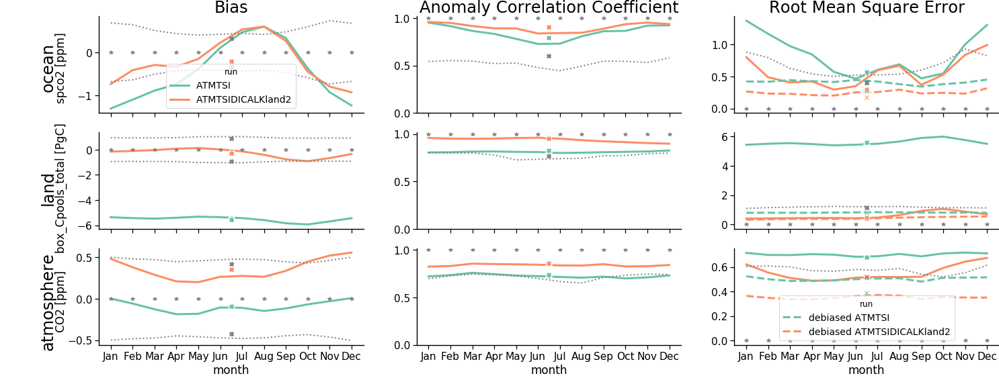

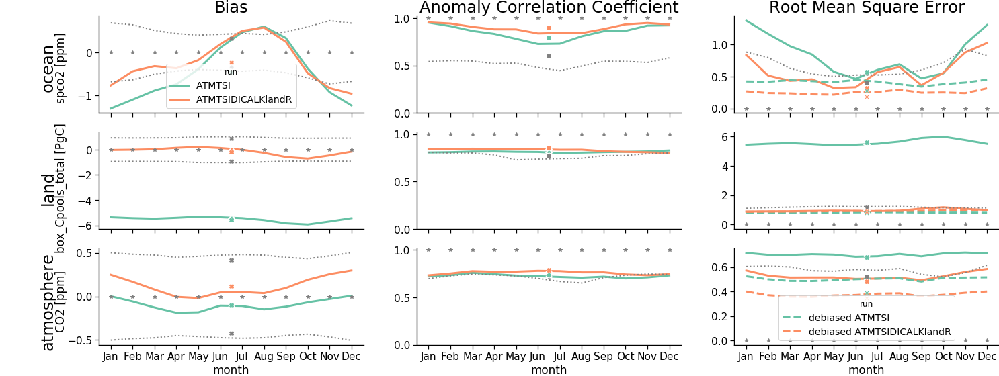

In [129]:
for direct_run in direct_runs:
    plot_plot_metric_over_month_indirect_direct_many(tpm[['spco2','box_Cpools_total','CO2']], direct_run=direct_run,label=new_name,rowlabel=['ocean','land','atmosphere'],
                                                 pub_ready=True)
    os.rename('metrics_month_in_direct_carbon_region_global.png', f'metrics_month_in_direct_carbon_region_global_land{direct_run[-1]}.png')

# Misc

In [41]:
def plot_timeseries(dss, ax=None):
    if ax is None:
        fig, ax = plt.subplots(figsize=(15, 3))
    if c in dss.run:
        dssc = dss.sel(run=c)
        dssc.plot(c="k", lw=4, zorder=10)
        dssr = dss.drop_sel(run=c)
    else:
        dssr = dss
    p = dssr.plot(hue="run", alpha=0.7)
    sns.despine()
    # try:
    #    ax.set_title(dss.coords["names"].values)
    # except:
    #    pass
    plt.legend(p, dss.run.values, loc="center left", bbox_to_anchor=(1, 0.5))

## spatial aggregation

In [46]:
name = "srex"
srex = getattr(regionmask.defined_regions, name)

In [47]:
name = "Longhurst"
gdf = geopandas.read_file(f"/home/mpim/m300524/.regionmask_data/{name}/{name}.shp")

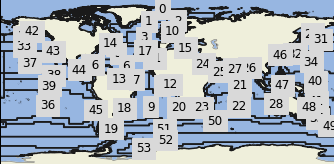

In [48]:
Longhurst = regionmask.from_geopandas(gdf, names="ProvDescr", abbrevs="ProvCode")
Longhurst.plot(add_land=True, add_ocean=True)

In [49]:
def to_regions(ds, region=None, agg_regions=None, mask=None):
    if "x" in ds.dims and "y" in ds.dims:
        stack_dims = "stacked_y_x"
        area = ocean_area
        if region is None and mask is None:
            region = ocean_regions
    elif "lat" in ds.dims and "lat" in ds.dims:
        stack_dims = "stacked_lat_lon"
        area = land_area
        if region is None and mask is None:
            region = srex_regions
    if mask is None and region is not None:
        mask = region.mask(ds)
    mask.name = "region"

    ds_sm = (ds * area).groupby(mask).sum(stack_dims)
    if isinstance(ds, xr.DataArray):
        ds = ds.to_dataset()
        was_dataset = False
    else:
        was_dataset = True

    if agg_regions is not None:
        print("found agg_regions:", agg_regions)

    ds_sm = ds_sm.map(
        reduce_unit_by_area_and_maybe_agg,
        agg_regions=agg_regions,
        mask=mask,
        area=area,
        stack_dims=stack_dims,
        keep_attrs=True,
    )
    if agg_regions == None and region is not None:
        ds_sm = set_regionmask_labels(ds_sm, region)

    if not was_dataset:
        ds_sm = ds_sm.to_array()
    return ds_sm

In [50]:
def reduce_unit_by_area_and_maybe_agg(
    da_sm, agg_regions=None, stack_dims=None, mask=None, area=None
):
    if "units" in da_sm.attrs:
        units = da_sm.attrs["units"]
        if "m-2" in units or "m-3" in units:
            da_sm.attrs["units"] = (
                da_sm.attrs["units"].replace("m-2", "").replace("m-3", "m-1")
            )
            da_sm = get_agg_regions(da_sm, agg_regions=agg_regions, how="sum")
        #if 'grid box' in units:
        #    da_sm = da_sm / (area.groupby(mask).sum(stack_dims))
        #    da_sm.attrs["units"] = da_sm.attrs["units"].replace('(grid box)','')
        else:
            assert da_sm.region.size > 0
            da_sm = da_sm / (area.groupby(mask).sum(stack_dims))
            assert da_sm.region.size > 0
            da_sm = get_agg_regions(da_sm, agg_regions=agg_regions, how="mean")
            assert da_sm.region.size > 0
    else: # if no units found spatial mean
        da_sm = da_sm / (area.groupby(mask).sum(stack_dims))
        da_sm = get_agg_regions(da_sm, agg_regions=agg_regions, how="mean")
    return da_sm


def set_regionmask_labels(ds, region):
    # extract the abbreviations and the names of the regions from regionmask
    abbrevs = region[ds.region.values].abbrevs
    names = region[ds.region.values].names
    ds.coords["abbrevs"] = ("region", abbrevs)
    ds.coords["names"] = ("region", names)
    return ds


agg_regions = {
    "Southern Ocean": [50, 51, 49],
    "Tropical Pacific": [39, 40, 38],
    "North Pacific": [30, 31, 29, 33],
    "North Atlantic": [2, 3, 1],
}


def get_agg_regions(ds_sm, agg_regions=agg_regions, how="mean"):
    """Aggregate regions based on `agg_regions` for analysis from Longhurst predefined regions."""
    if agg_regions is None:
        return ds_sm
    ds_agg_list = []
    for key, value in agg_regions.items():
        ds_agg_list.append(getattr(ds_sm.sel(region=value), how)("region"))
    ds_sm_agg = xr.concat(ds_agg_list, "region")
    ds_sm_agg["region"] = list(agg_regions.keys())
    return ds_sm_agg

## Composites

### CVDP

In [53]:
f = !ls /work/bm1124/m300524/experiments/vga0220a_Rerun/outdata/cvdp/*.nc

f = [i.split("/")[-1] for i in f]
f = [".".join(i.split(".")[2:-2]) for i in f]

In [51]:
# postpath = "./"
targetyear, baseyear = 1850, 2006
recompute = False
# indexfilename = "psl.sam_psa"
# indexfilename = "sst.indices"
for indexfilename in f:
    print(indexfilename)
    if recompute:
        ds_list = []
        runs_found = []
        for assim in runs:
            try:
                expid = f"asp_esmControl_PMassim_{targetyear}_{assim}_over_{baseyear}"
                if assim == c:
                    expid = assim
                cvdp_path = f"{workpath}{expid}/outdata/cvdp"
                # files=f'{cvdp_path}/{expid}.cvdp_data.psl.nam_nao.3170-3269.nc'
                files = f"{cvdp_path}/{expid}.cvdp_data.{indexfilename}.1850-1898.nc"
                ds = xr.open_mfdataset(files, decode_times=False)  # ,concat_dim='time')
                ds_list.append(ds)
                runs_found.append(assim)
                # print(f"{assim} success")
            except Exception as e:
                print(f"{assim} failed: {e}")
        ds_cvdp = xr.concat(ds_list, "run")
        ds_cvdp["run"] = runs_found
        ds_cvdp = ds_cvdp.load()
        filename = f"./PMassim_{targetyear}_over_{baseyear}_{indexfilename}_CVDP.nc"
        ds_cvdp.to_netcdf(filename)
        print(ds_cvdp.nbytes / 1e6, "MB")
        try:
            ds_cvdp["time"] = xr.cftime_range(
                start="1850", freq="MS", periods=ds_cvdp.time.size
            )
        except:
            pass

amo
pdo
pr.mean_stddev
pr.trends_timeseries
psl.mean_stddev
psl.nam_nao
psl.nam_nao.ts
psl.pna_npo
psl.pna_npo.ts
psl.sam_psa
psl.sam_psa.ts
psl.sst.indices.tas
psl.trends
snd.mean_stddev
snd.trends
sst.indices
sst.indices.ppt
sst.indices.psl
sst.mean_stddev
sst.trends_timeseries
tas.mean_stddev
tas.trends_timeseries


In [ ]:
indexfilename = "sst.indices"
filename = f"./PMassim_{targetyear}_over_{baseyear}_{indexfilename}_CVDP.nc"
ds_cvdp = xr.open_dataset(filename, decode_times=False).load()

In [183]:
indexfilename_dict=dict()
indexfilename_dict['sam'] = 'psl.sam_psa'
indexfilename_dict['nao'] = 'psl.nam_nao'

In [206]:
clim_indices = ['pdo','amo', 'sam','nao']
clim_indices_ds = []
ta = 'mon'
for index in clim_indices:
    indexfilename = indexfilename_dict[index] if index in indexfilename_dict else index
    filename = f"/work/bm1124/m300524/experiments/vga0220a_Rerun/outdata/cvdp/vga0220a_Rerun.cvdp_data.{indexfilename}.1850-1898.nc"
    indexvarname = f'{index}_pc_{ta}' if index in ['sam','nao'] else f'{index}_timeseries_{ta}'
    clim_indices_ds.append(xr.open_dataset(filename, decode_times=False)[indexvarname])

filename = f"/work/bm1124/m300524/experiments/vga0220a_Rerun/outdata/cvdp/vga0220a_Rerun.cvdp_data.sst.indices.1850-1898.nc"
tindices = ['nino34','nino12','nino3','nino4','southern_ocean']
for i in tindices:
    clim_indices_ds.append(xr.open_dataset(filename, decode_times=False)[i])

clim_indices_ds = xr.concat(clim_indices_ds,'index').load()
clim_indices_ds['index'] = clim_indices+tindices

clim_indices_ds['time']=xr.cftime_range(start='1850',freq='MS',periods=clim_indices_ds.time.size)

In [207]:
clim_indices_ds = (clim_indices_ds-clim_indices_ds.mean('time'))/clim_indices_ds.std('time')

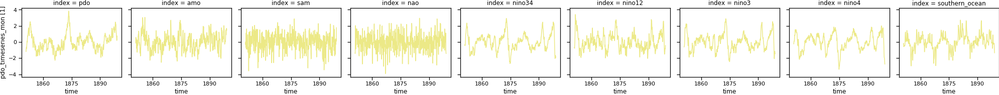

In [209]:
clim_indices_ds.isel(time=slice(12,None)).plot(col='index')

In [49]:
sruns = dict()
sruns["spco2"] = ["ATM", "TSI", "ATMTSI", "ATMTSIDICALK"]
sruns["tos"] = ["ATM", "TSI", "ATMsfnTS", "ATMTSI"]
default_runs = ["SSTSSS", "TS", "ATM", "ATMTSI"]


def plot_composites_diff(comp_diff, feature=None):
    v = comp_diff.name
    if output_df2.loc[v].model in ["jsbach", "echam6"]:
        # plot atm
        import cartopy.crs as ccrs

        p = comp_diff.sel(run=sruns.get(v, default_runs)).plot(
            col="run",
            row="index",
            aspect=2.4,
            subplot_kws={"projection": ccrs.PlateCarree()},
            transform=ccrs.PlateCarree(),
            robust=True,
        )
        for ax in p.axes.flat:
            ax.coastlines()
    elif output_df2.loc[v].model in ["mpiom", "hamocc"]:
        # plot ocean
        ctm = sns.plotting_context(
            "talk",  # rc={"lines.linewidth": 1.5, "axes.grid": True, "axes.labelsize": "small"}
        )
        with sns.plotting_context(ctm):
            comp_diff.sel(run=sruns.get(v, default_runs)).plot_map(
                col="run", row="index", aspect=2.4, feature=feature
            )
            plt.suptitle(
                f"{indexstr} composites: Difference: run - target",
                y=1,
                x=0.4,
                fontsize="large",
            )
            if savefig:
                plt.savefig(f"{indexstr}_composite_{v}.jpg")
    else:
        comp_diff[v].sel(run=sruns[v]).plot(col="run", row="index", **pa)

### composites

In [ ]:
index='amo'

In [ ]:
comp = et.composite.composite_analysis(dsz.chunk({"run": 1}), clim_indices_ds.sel(index=index))
# comp

%time comp=comp.compute()

comp_diff = diff_c(comp)

In [ ]:
_ = comp_diff.map(plot_composites_diff)

## spco2 decomposition

In [55]:
name = "ocean"
zarrpath = f"{postpath}/{name}.zarr"
dsz = xr.open_zarr(zarrpath)

In [576]:
# global mean
# dsz = global_agg(dsz)
# dsz = dsz.compute()

In [577]:
# dont aggregate time before
# dsz = dsz.groupby("time.year").mean().rename({"year": "time"})

In [579]:
from esmtools.carbon import spco2_sensitivity, spco2_decomposition

dsz2 = dsz[["dissicos", "spco2", "tos", "sos", "talkos"]]

spco2_decomp = spco2_decomposition(
    dsz2, detrend=False, deseasonalize=True
)  # .compute()

In [580]:
# sum up contributions
spco2_decomp["sum"] = spco2_decomp.to_array().sum("variable")

# add actual spco2 anomalies to dataset
spco2_decomp["spco2"] = dsz2["spco2"] - dsz2["spco2"].mean("time")

In [581]:
# afterwards ok but not before
spco2_decomp = spco2_decomp.groupby("time.year").mean().rename({"year": "time"})

In [ ]:
%time spco2_decomp = spco2_decomp.compute()

In [ ]:
# quick plot
if len(spco2_decomp.dims)>3:
    spco2_decomp.to_array().isel(time=range(4)).plot(
        row="variable", col="time", robust=True, yincrease=False
    )
else:
    spco2_decomp.to_array().plot(hue='variable',row='run',figsize=(20,30))
    plt.ylim([-5,5])
    #plt.xlim(['1850','1898'])

In [64]:
# diff to control
#diff_c(spco2_decomp).to_array().plot(hue='variable',row='run',figsize=(20,30))
#plt.ylim([-5,5])

In [ ]:
import esmtools as et

index = cvdp_indices["nino34"].sel(run='vga0220a_Rerun')
%time comp = et.composite.composite_analysis(spco2_decomp, index)

In [ ]:
%time comp=comp.compute()

In [ ]:
comp